<a href="https://colab.research.google.com/github/GloriaABK/GroupExam381/blob/main/GroupExam_INFO381.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports
The imports for the necessary packages used in the preprocessing and the EDA part of the project


In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

# Preprocessing and EDA

In [ ]:
#Uploading the dataset
file_path = "adult.csv"
df = pd.read_csv(file_path)

In [ ]:
df.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [ ]:
df.tail()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
48841,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


Checking if there are any missing values

In [ ]:
df.isnull().sum()

,0
age,0
workclass,0
fnlwgt,0
education,0
educational-num,0
marital-status,0
occupation,0
relationship,0
race,0
gender,0


Checking how many categories there are within each of the columns that are categorical (object). This is important since the missing value check showed that there are not any missing values.

In [ ]:
categorical_cols = df.select_dtypes(include=['object']).columns
print("\nUnique Values in Categorical Columns:")
for col in categorical_cols:
    print(f"{col}: {df[col].unique()}")


Unique Values in Categorical Columns:
workclass: ['Private' 'Local-gov' '?' 'Self-emp-not-inc' 'Federal-gov' 'State-gov'
 'Self-emp-inc' 'Without-pay' 'Never-worked']
education: ['11th' 'HS-grad' 'Assoc-acdm' 'Some-college' '10th' 'Prof-school'
 '7th-8th' 'Bachelors' 'Masters' 'Doctorate' '5th-6th' 'Assoc-voc' '9th'
 '12th' '1st-4th' 'Preschool']
marital-status: ['Never-married' 'Married-civ-spouse' 'Widowed' 'Divorced' 'Separated'
 'Married-spouse-absent' 'Married-AF-spouse']
occupation: ['Machine-op-inspct' 'Farming-fishing' 'Protective-serv' '?'
 'Other-service' 'Prof-specialty' 'Craft-repair' 'Adm-clerical'
 'Exec-managerial' 'Tech-support' 'Sales' 'Priv-house-serv'
 'Transport-moving' 'Handlers-cleaners' 'Armed-Forces']
relationship: ['Own-child' 'Husband' 'Not-in-family' 'Unmarried' 'Wife' 'Other-relative']
race: ['Black' 'White' 'Asian-Pac-Islander' 'Other' 'Amer-Indian-Eskimo']
gender: ['Male' 'Female']
native-country: ['United-States' '?' 'Peru' 'Guatemala' 'Mexico' 'Dominica

The value checking of each categorical column showed that the missing values in the dataset are defined as '?', therefore we check how many of these there are in each (object) column

In [ ]:
df.replace("?", pd.NA, inplace=True)
df.isnull().sum()

,0
age,0
workclass,2799
fnlwgt,0
education,0
educational-num,0
marital-status,0
occupation,2809
relationship,0
race,0
gender,0


In [ ]:
#Checking how much the missing values are in terms of % in each of the columns
missing_percentage = (df.isnull().sum() / len(df)) * 100

missing_percentage = missing_percentage[missing_percentage > 0].sort_values(ascending=False)

print("\nPercentage of Missing Values in Each Column:")
print(missing_percentage)


Percentage of Missing Values in Each Column:
occupation        5.751198
workclass         5.730724
native-country    1.754637
dtype: float64


In [ ]:
#Deciding to remove/drop the rows that include missing values, which resulted in the rows decreasing to 45222
df.dropna(inplace=True)
print(f"\nDataset after dropping missing values: {df.shape}")


Dataset after dropping missing values: (45222, 15)


In [ ]:
#Removing columns that will not be used in the model training, since they don't give any new and necessary information for income prediciton
df.drop(columns=['fnlwgt', 'educational-num'], inplace=True)
print(f"\nDataset after dropping columns: {df.shape}")


Dataset after dropping columns: (45222, 13)


To make sure the encoding further in the code does not make too many new categories, we grouped the education levels into dropout if the person has not finished highschool. HS-grad, CommunityCollege, Bachelors, Masters and Doctorate

In [ ]:
df['education'].replace('Preschool', 'dropout',inplace=True)
df['education'].replace('10th', 'dropout',inplace=True)
df['education'].replace('11th', 'dropout',inplace=True)
df['education'].replace('12th', 'dropout',inplace=True)
df['education'].replace('1st-4th', 'dropout',inplace=True)
df['education'].replace('5th-6th', 'dropout',inplace=True)
df['education'].replace('7th-8th', 'dropout',inplace=True)
df['education'].replace('9th', 'dropout',inplace=True)
df['education'].replace('HS-Grad', 'HighGrad',inplace=True)
df['education'].replace('HS-grad', 'HighGrad',inplace=True)
df['education'].replace('Some-college', 'CommunityCollege',inplace=True)
df['education'].replace('Assoc-acdm', 'CommunityCollege',inplace=True)
df['education'].replace('Assoc-voc', 'CommunityCollege',inplace=True)
df['education'].replace('Bachelors', 'Bachelors',inplace=True)
df['education'].replace('Masters', 'Masters',inplace=True)
df['education'].replace('Prof-school', 'Masters',inplace=True)
df['education'].replace('Doctorate', 'Doctorate',inplace=True)

<ipython-input-12-56e2cc6715cd>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['education'].replace('Preschool', 'dropout',inplace=True)
<ipython-input-12-56e2cc6715cd>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True

Same procedure as for the educational level, we grouped the material status into main groups; NotMarried, Married, Separated and Widowed

In [ ]:
df['marital-status'].replace('Never-married', 'NotMarried',inplace=True)
df['marital-status'].replace(['Married-AF-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-civ-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-spouse-absent'], 'NotMarried',inplace=True)
df['marital-status'].replace(['Separated'], 'Separated',inplace=True)
df['marital-status'].replace(['Divorced'], 'Separated',inplace=True)
df['marital-status'].replace(['Widowed'], 'Widowed',inplace=True)

<ipython-input-13-5767f8810bd1>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['marital-status'].replace('Never-married', 'NotMarried',inplace=True)
<ipython-input-13-5767f8810bd1>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, 

In [ ]:
df['race'].replace('Asian-Pac-Islander', 'Other',inplace=True)
df['race'].replace('Amer-Indian-Eskimo', 'Other',inplace=True)

<ipython-input-14-ef4675f7afae>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['race'].replace('Asian-Pac-Islander', 'Other',inplace=True)
<ipython-input-14-ef4675f7afae>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tr

## Visualizations

### Income - Target value

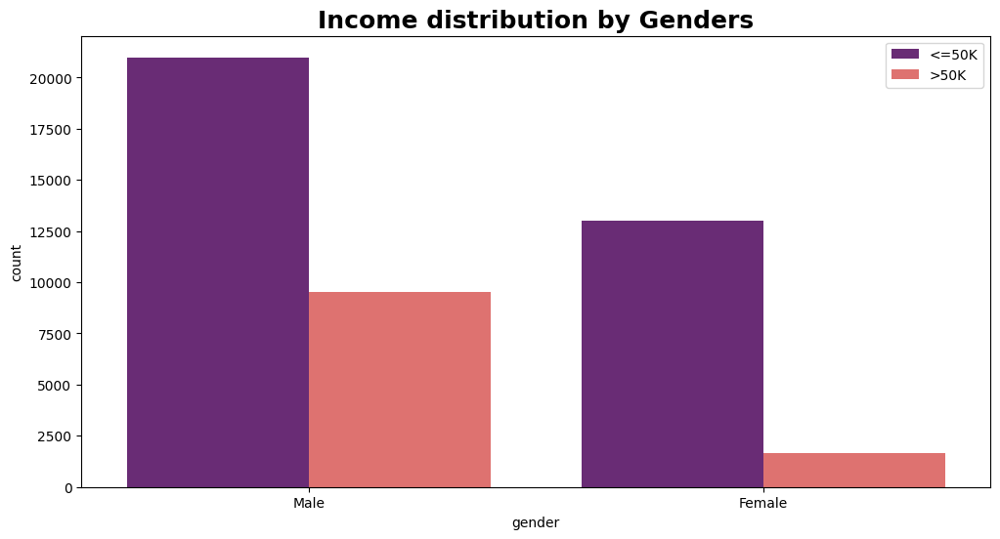

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['gender'], hue=df['income'], palette='magma')

plt.title('Income distribution by Genders', fontsize=18, fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)

plt.show()

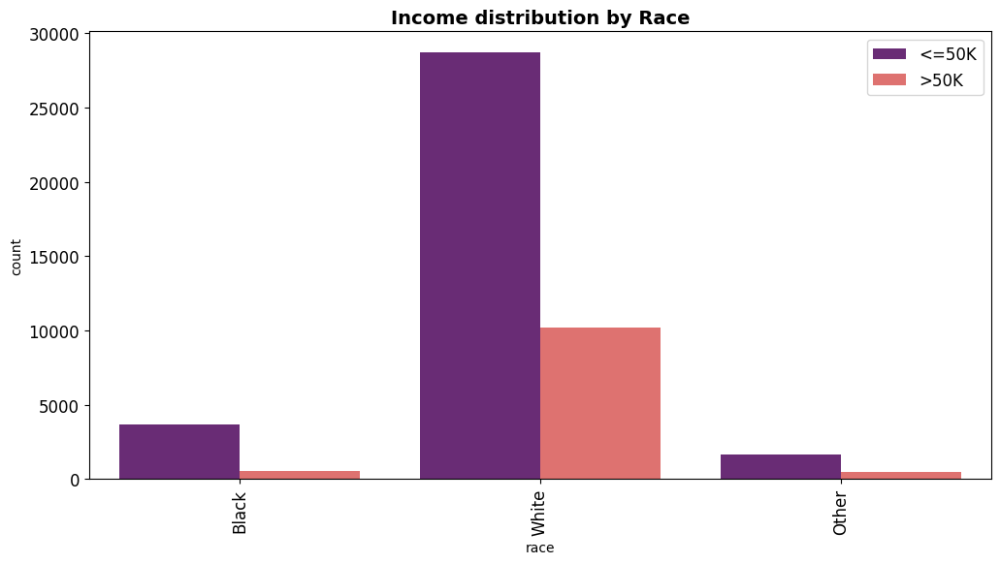

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['race'], hue=df['income'], palette='magma')

plt.title('Income distribution by Race', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, rotation = 90)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

plt.show()

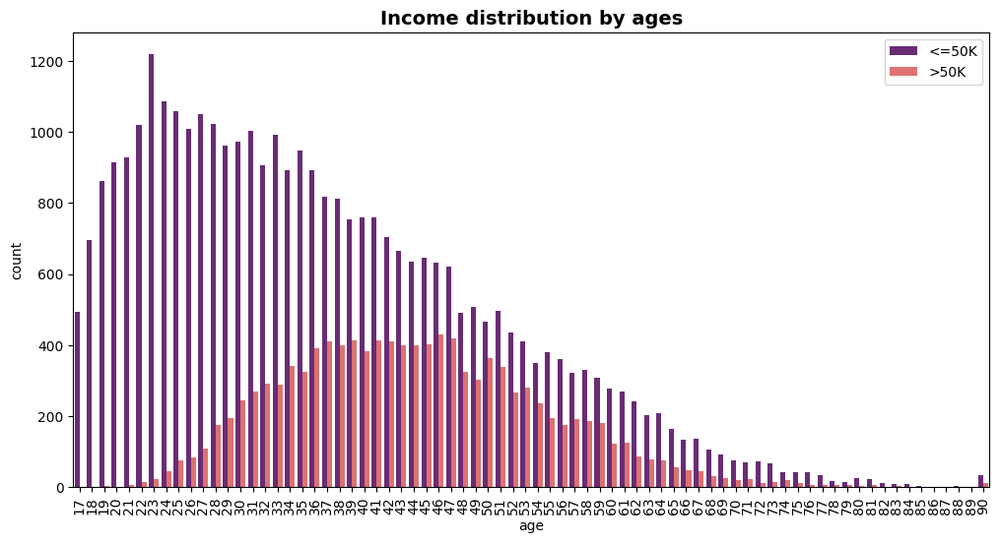

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['age'], hue=df['income'], palette='magma')

plt.title('Income distribution by ages', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation = 90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)

plt.show()

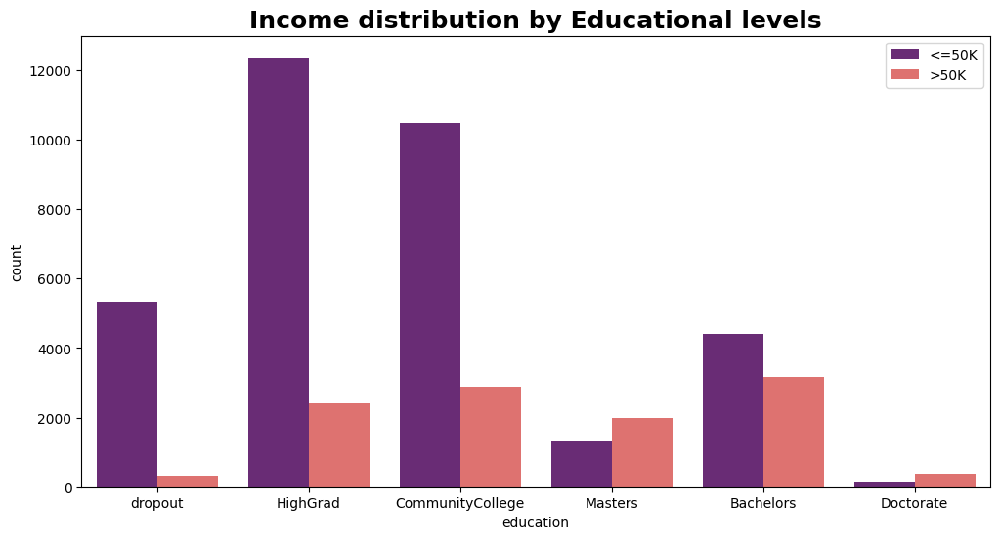

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['education'], hue=df['income'], palette='magma')

plt.title('Income distribution by Educational levels', fontsize=18, fontweight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)

plt.show()

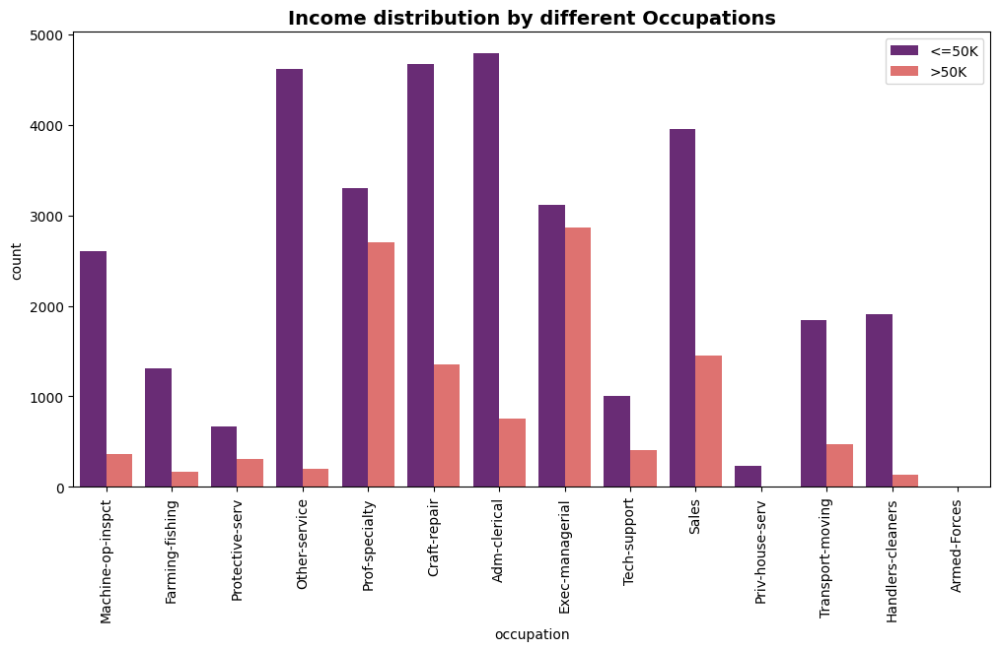

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['occupation'], hue=df['income'], palette='magma')

plt.title('Income distribution by different Occupations', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation = 90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)

plt.show()

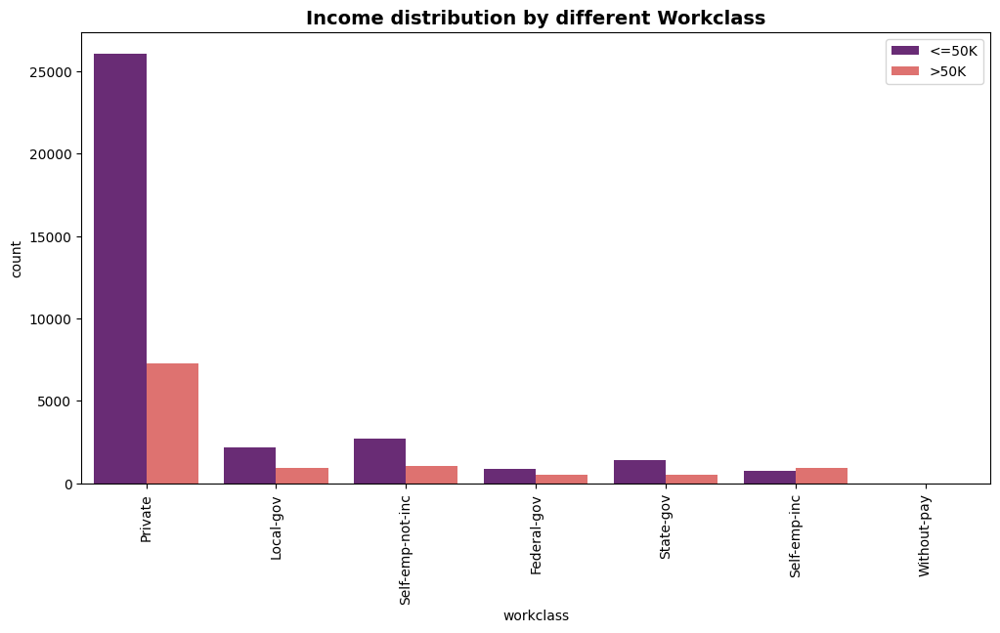

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['workclass'], hue=df['income'], palette='magma')

plt.title('Income distribution by different Workclass', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation = 90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)

plt.show()

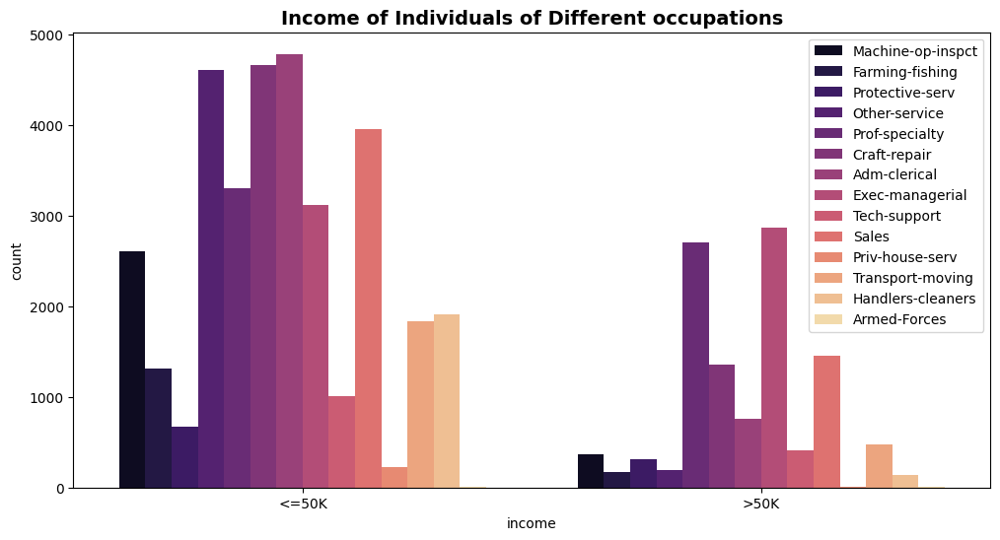

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x='income',hue='occupation',data=df,palette='magma')

plt.title('Income of Individuals of Different occupations', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.show()

Since the INCOME column just have two values, we can encode them to 0 and 1, such that they are easier to visualize, and to use as numerical values

In [ ]:
df['income']=df['income'].map({'<=50K': 0, '>50K': 1})

In [ ]:
#Checking that the 'income' column is correctly mapped into a numerical column
numeric_columns = df.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns:", numeric_columns)


Numeric columns: ['age', 'capital-gain', 'capital-loss', 'hours-per-week', 'income']


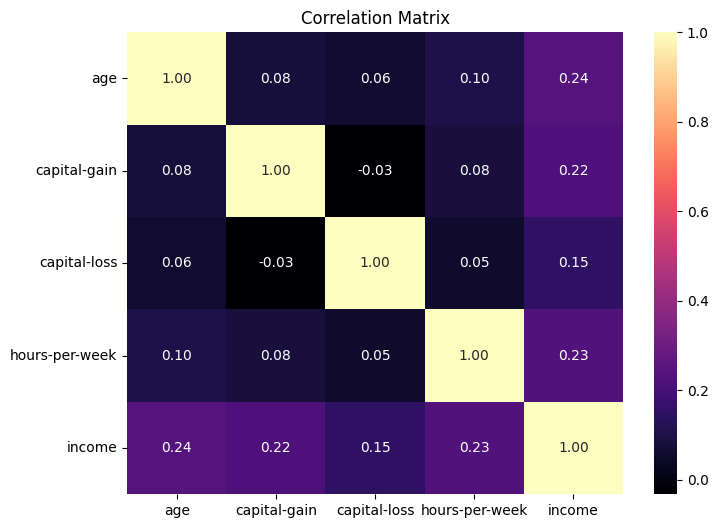

In [ ]:
plt.figure(figsize=(8, 6))
corr = df[numeric_columns].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="magma")
plt.title("Correlation Matrix")
plt.show()

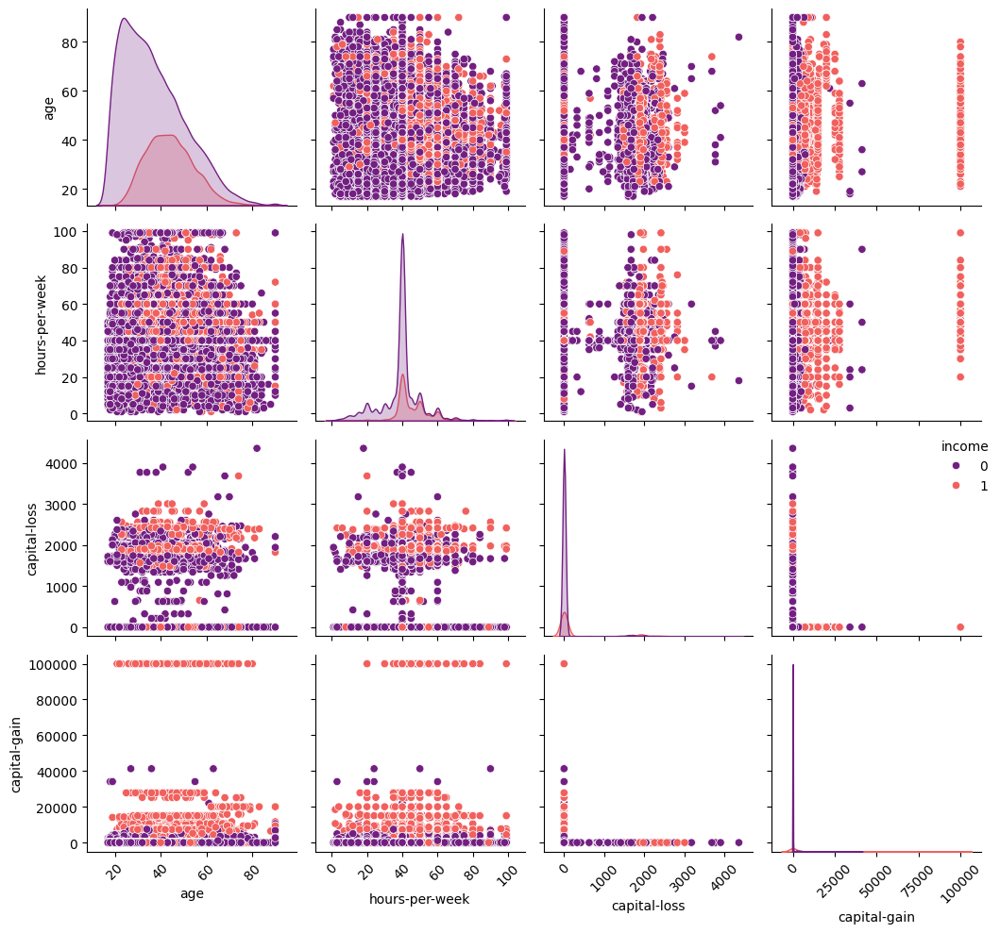

In [ ]:
selected_columns = ['age', 'hours-per-week', 'capital-loss', 'capital-gain', 'income']
pairplot = sns.pairplot(df[selected_columns], hue='income', palette='magma')

for ax in pairplot.axes.flatten():
    if ax:
        ax.xaxis.set_major_locator(plt.MaxNLocator(nbins=6))
        ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


### Age

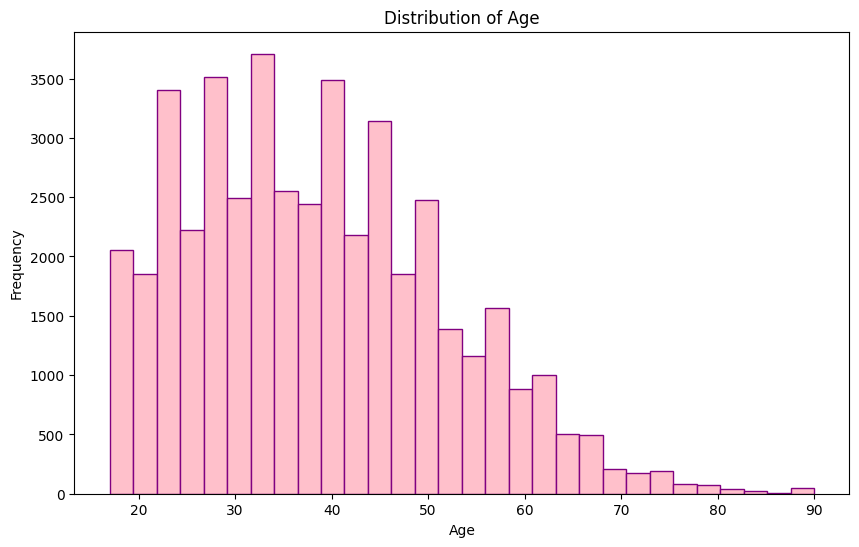

In [ ]:
plt.figure(figsize=(10,6))
plt.hist(df['age'], bins=30, edgecolor='purple', color='pink')
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

### Race

<ipython-input-27-93f60f14b9ab>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='race', data=df, palette='viridis')


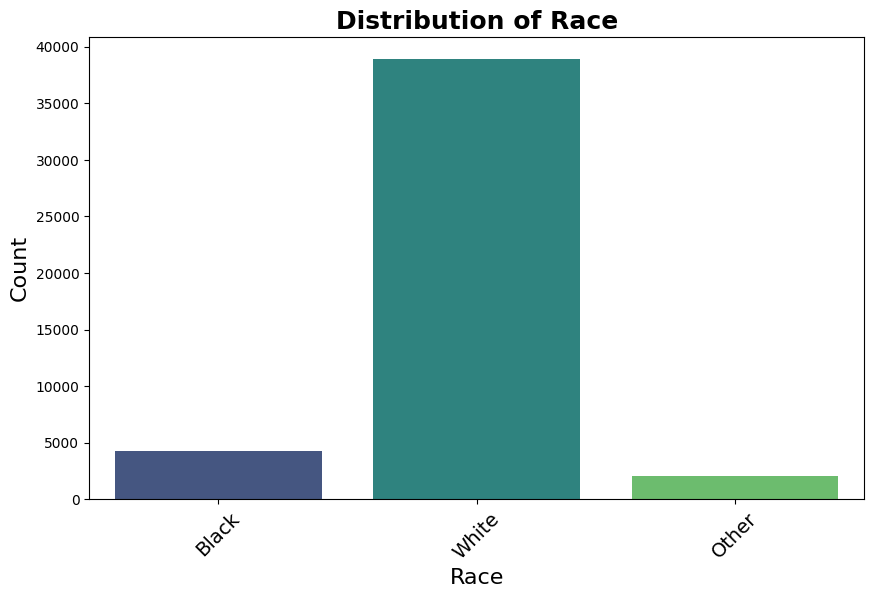

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(x='race', data=df, palette='viridis')
plt.title('Distribution of Race', fontsize=18, fontweight='bold')
plt.xlabel('Race', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.xticks(rotation=45, fontsize=14)
plt.show()

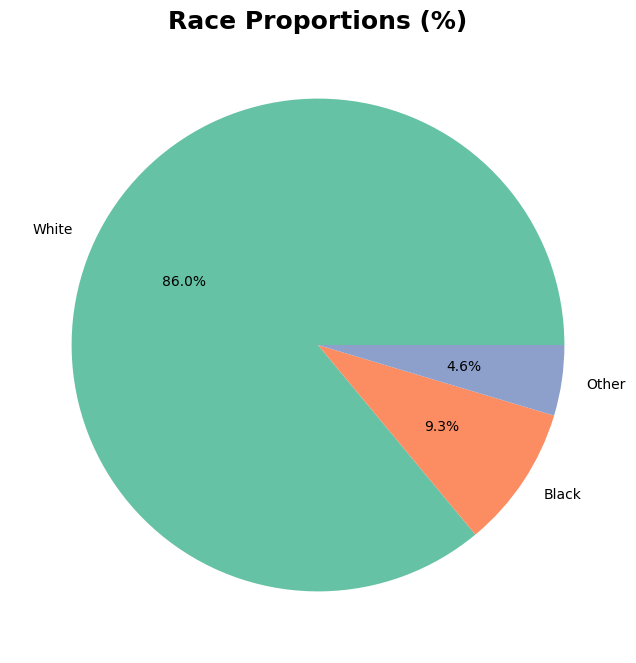

In [ ]:
race_counts = df['race'].value_counts()

plt.figure(figsize=(8,8))
plt.pie(race_counts, labels=race_counts.index, autopct='%1.1f%%', colors=plt.cm.Set2.colors[:3])
plt.title('Race Proportions (%)', fontsize=18, fontweight='bold')
plt.show()

### Education

<ipython-input-29-50ee579dd296>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='education',


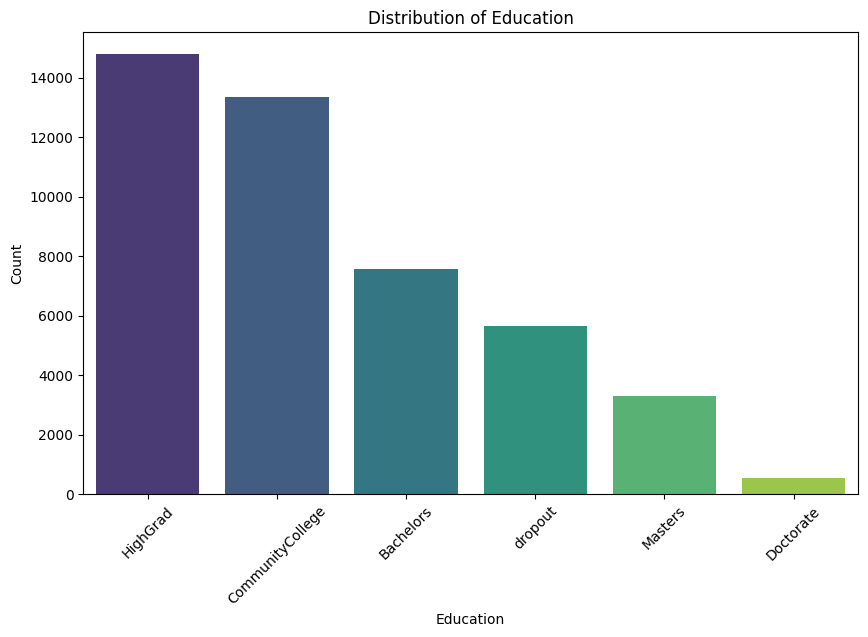

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='education',
              order=df['education'].value_counts().index,
              palette="viridis")
plt.title('Distribution of Education')
plt.xlabel('Education')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

### Material Status and Relationship

<ipython-input-30-d3e1d1390eeb>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='marital-status',


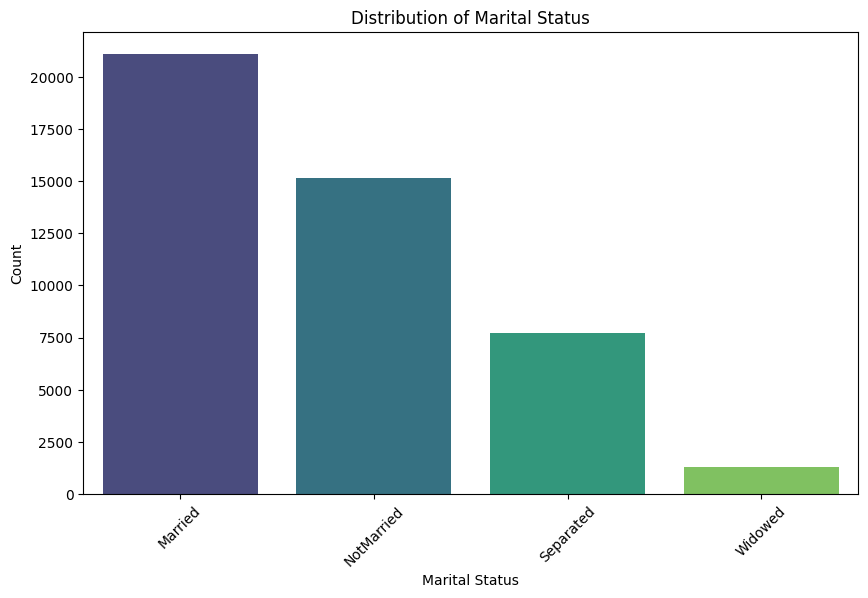

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='marital-status',
              order=df['marital-status'].value_counts().index,
              palette="viridis")
plt.title('Distribution of Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

### Capital gain and loss

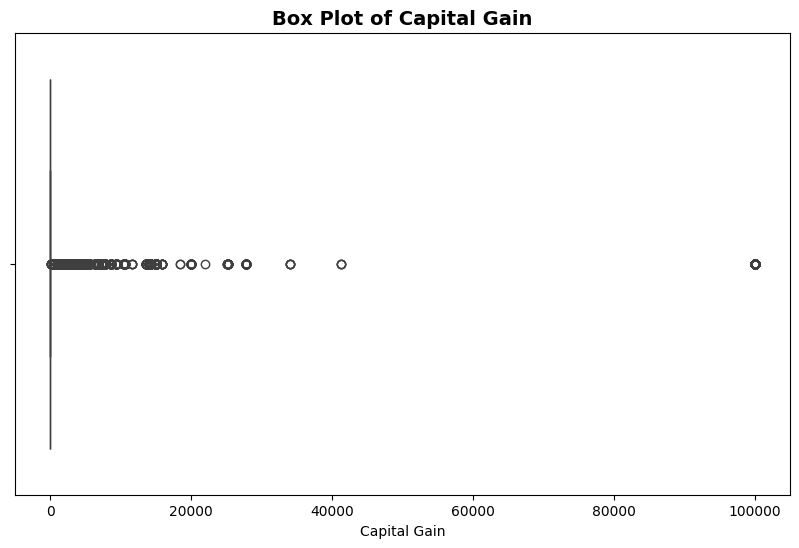

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x=df['capital-gain'])
plt.title('Box Plot of Capital Gain', fontsize=14, fontweight='bold')
plt.xlabel('Capital Gain', fontsize=10)
plt.show()

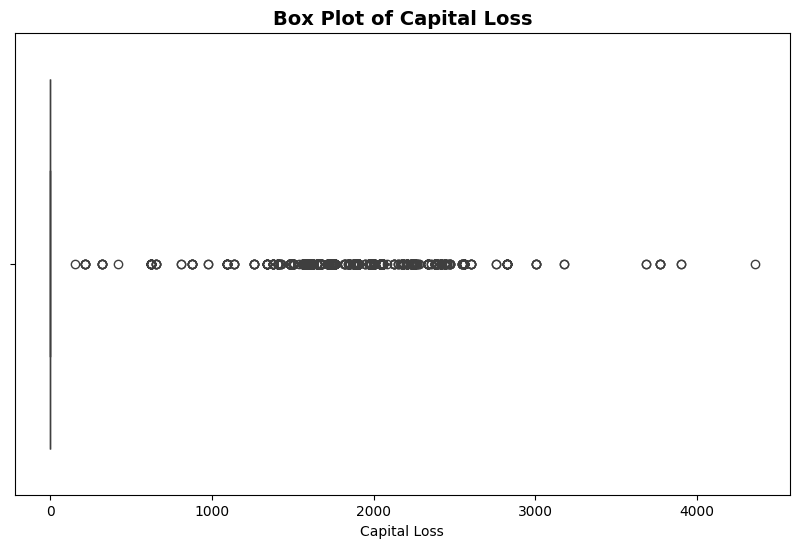

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x=df['capital-loss'])
plt.title('Box Plot of Capital Loss', fontsize=14, fontweight='bold')
plt.xlabel('Capital Loss', fontsize=10)
plt.show()

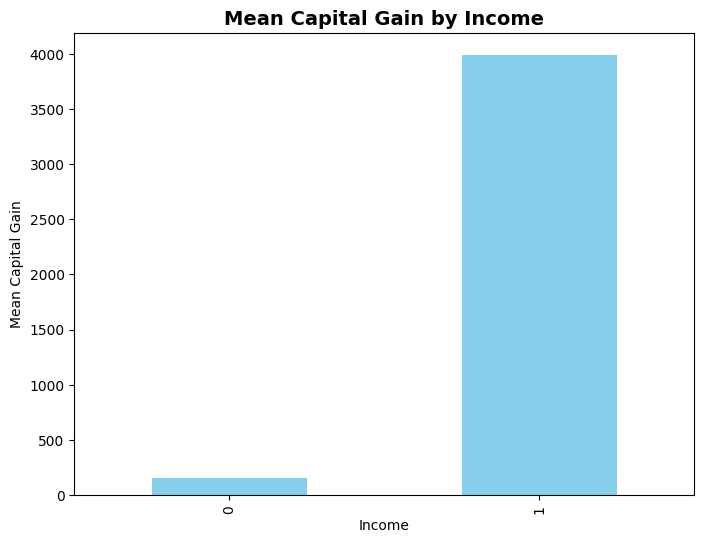

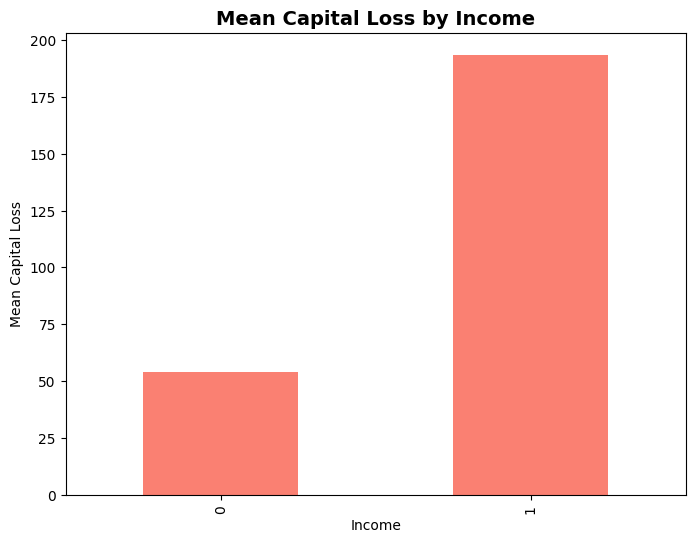

In [ ]:
plt.figure(figsize=(8,6))
df.groupby('income')['capital-gain'].mean().plot(kind='bar', color='skyblue')
plt.title('Mean Capital Gain by Income', fontsize=14, fontweight='bold')
plt.xlabel('Income', fontsize=10)
plt.ylabel('Mean Capital Gain', fontsize=10)
plt.show()

plt.figure(figsize=(8,6))
df.groupby('income')['capital-loss'].mean().plot(kind='bar', color='salmon')
plt.title('Mean Capital Loss by Income', fontsize=14, fontweight='bold')
plt.xlabel('Income', fontsize=10)
plt.ylabel('Mean Capital Loss', fontsize=10)
plt.show()

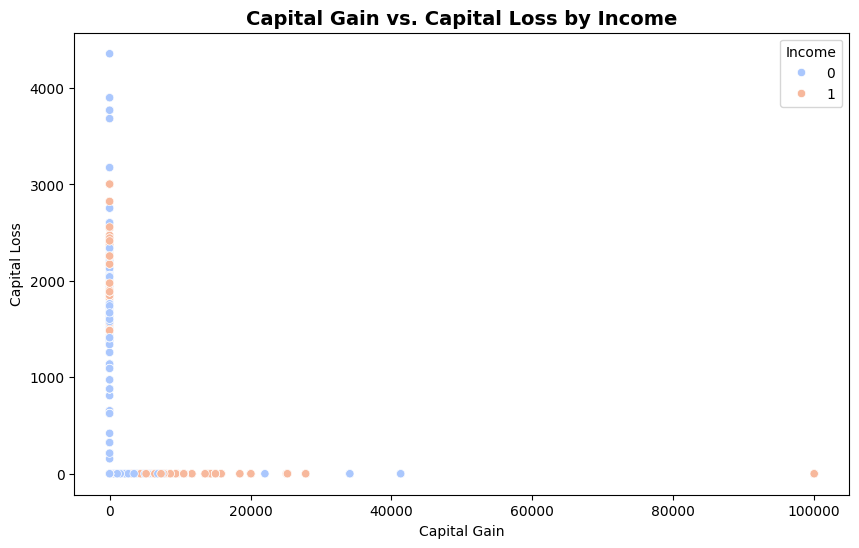

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='capital-gain', y='capital-loss', data=df, hue='income', palette='coolwarm')
plt.title('Capital Gain vs. Capital Loss by Income', fontsize=14, fontweight='bold')
plt.xlabel('Capital Gain', fontsize=10)
plt.ylabel('Capital Loss', fontsize=10)
plt.legend(title='Income', fontsize=10)
plt.show()

### Native Country

To get a better understanding of the distribution of the income by the native country of the individuals, we looked at how the distribution is between people earning more and less than 50k for each of country.

In [ ]:
income_by_country = df.groupby('native-country')['income'].mean()
print(income_by_country.sort_values(ascending=False))

native-country
Taiwan                        0.454545
France                        0.444444
India                         0.421769
England                       0.394958
Iran                          0.392857
Canada                        0.368098
Greece                        0.367347
Japan                         0.348315
Yugoslavia                    0.347826
Cambodia                      0.346154
Hungary                       0.333333
Italy                         0.330000
China                         0.318584
Germany                       0.300518
Philippines                   0.296820
Hong                          0.285714
Ireland                       0.277778
Cuba                          0.255639
United-States                 0.253027
Poland                        0.197531
Portugal                      0.193548
South                         0.178218
Thailand                      0.172414
Ecuador                       0.139535
Jamaica                       0.135922
Haiti     

Similarily to the grouping for education level and marital status done earilier, we now also decided to group the native countries into continents instead. This is also done to reduce the number of encoded columns, as we plan to use one-hot encoding later for the model training. By having fewer different categories within one column, we reduce the number of columns created while one-hot encoding.

In [ ]:
country_to_continent = {
    'United-States': 'North America',
    'Canada': 'North America',
    'Mexico': 'North America',
    'Outlying-US(Guam-USVI-etc)': 'North America',

    'England': 'Europe',
    'France': 'Europe',
    'Germany': 'Europe',
    'Greece': 'Europe',
    'Hungary': 'Europe',
    'Ireland': 'Europe',
    'Italy': 'Europe',
    'Poland': 'Europe',
    'Portugal': 'Europe',
    'Scotland': 'Europe',
    'Holand-Netherlands': 'Europe',
    'Yugoslavia': 'Europe',

    'India': 'Asia',
    'Japan': 'Asia',
    'China': 'Asia',
    'Taiwan': 'Asia',
    'Iran': 'Asia',
    'Philippines': 'Asia',
    'Thailand': 'Asia',
    'Laos': 'Asia',
    'Vietnam': 'Asia',
    'Cambodia': 'Asia',
    'Hong': 'Asia',

    'Cuba': 'Latin America',
    'Puerto-Rico': 'Latin America',
    'Columbia': 'Latin America',
    'Honduras': 'Latin America',
    'Ecuador': 'Latin America',
    'Peru': 'Latin America',
    'El-Salvador': 'Latin America',
    'Nicaragua': 'Latin America',
    'Dominican-Republic': 'Latin America',
    'Guatemala': 'Latin America',
    'Jamaica': 'Latin America',
    'Haiti': 'Latin America',
    'Trinadad&Tobago': 'Latin America',
    'South': 'Latin America',
}

In [ ]:
df['continent'] = df['native-country'].map(lambda x: country_to_continent.get(x, 'Other'))

print(df[['native-country', 'continent']].head())

  native-country      continent
0  United-States  North America
1  United-States  North America
2  United-States  North America
3  United-States  North America
5  United-States  North America


In [ ]:
country_counts = df['continent'].value_counts()
print(country_counts)

continent
North America    42380
Latin America     1174
Asia               930
Europe             738
Name: count, dtype: int64


In [ ]:
income_by_continent = df.groupby('continent')['income'].mean()
print(income_by_continent.sort_values(ascending=False))

continent
Asia             0.312903
Europe           0.306233
North America    0.249080
Latin America    0.114991
Name: income, dtype: float64


<ipython-input-40-2cad2c9e8b10>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='continent', y='income', data=income_by_continent, palette="viridis")


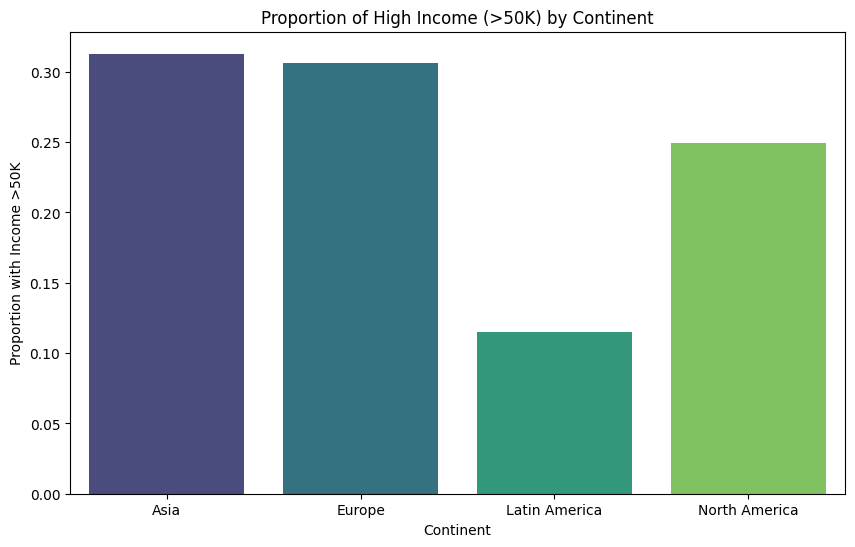

In [ ]:
income_by_continent = df.groupby('continent')['income'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='continent', y='income', data=income_by_continent, palette="viridis")
plt.title("Proportion of High Income (>50K) by Continent")
plt.xlabel("Continent")
plt.ylabel("Proportion with Income >50K")
plt.show()

<ipython-input-41-f91fdc0d4392>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='native-country', y='income', data=income_by_country, palette="viridis")


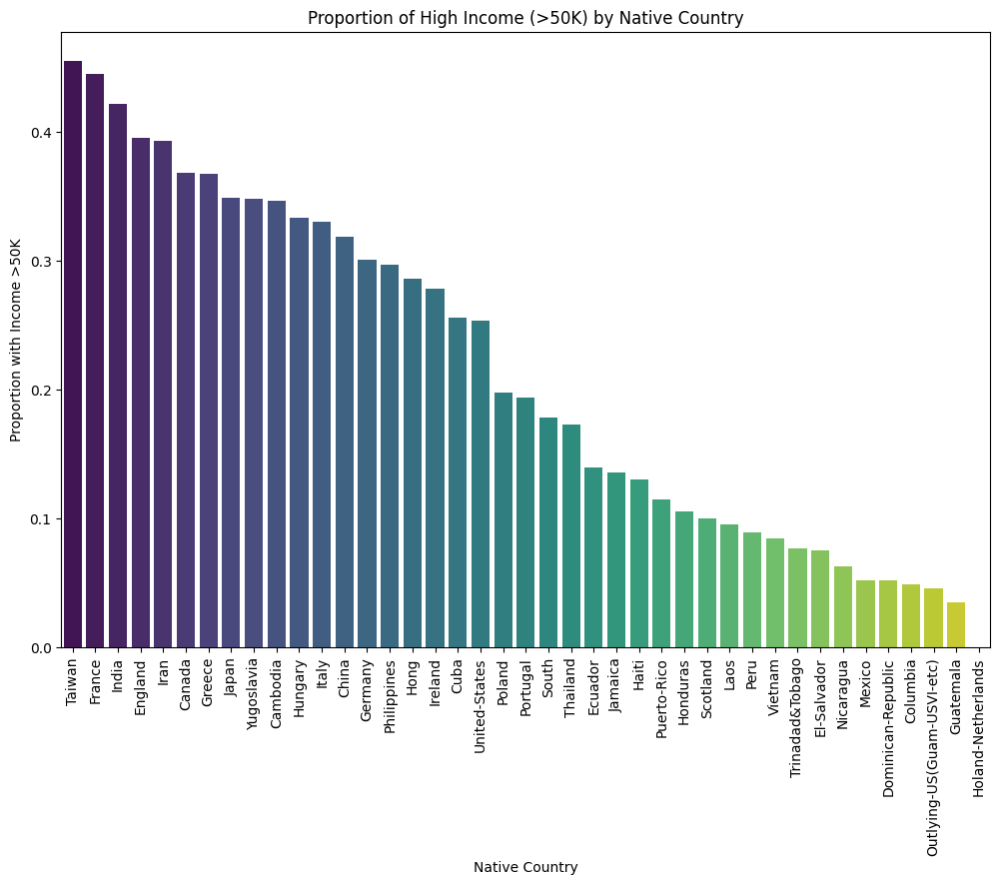

In [ ]:
income_by_country = df.groupby('native-country')['income'].mean().reset_index()

income_by_country = income_by_country.sort_values(by='income', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='native-country', y='income', data=income_by_country, palette="viridis")
plt.title("Proportion of High Income (>50K) by Native Country")
plt.xlabel("Native Country")
plt.ylabel("Proportion with Income >50K")
plt.xticks(rotation=90)
plt.show()

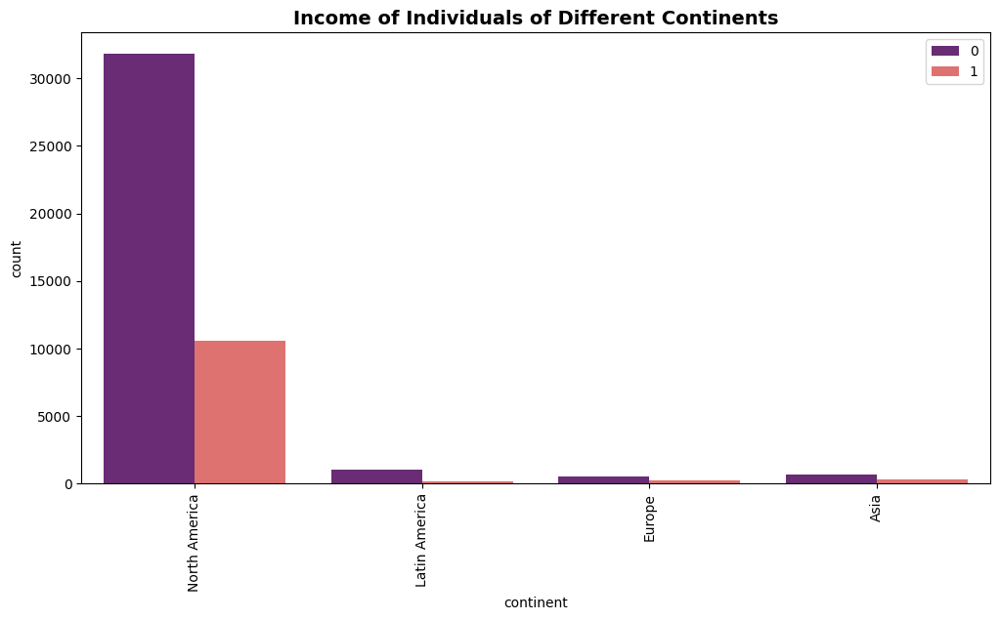

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['continent'], hue=df['income'], palette='magma')

plt.title('Income of Individuals of Different Continents', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation = 90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)

plt.show()

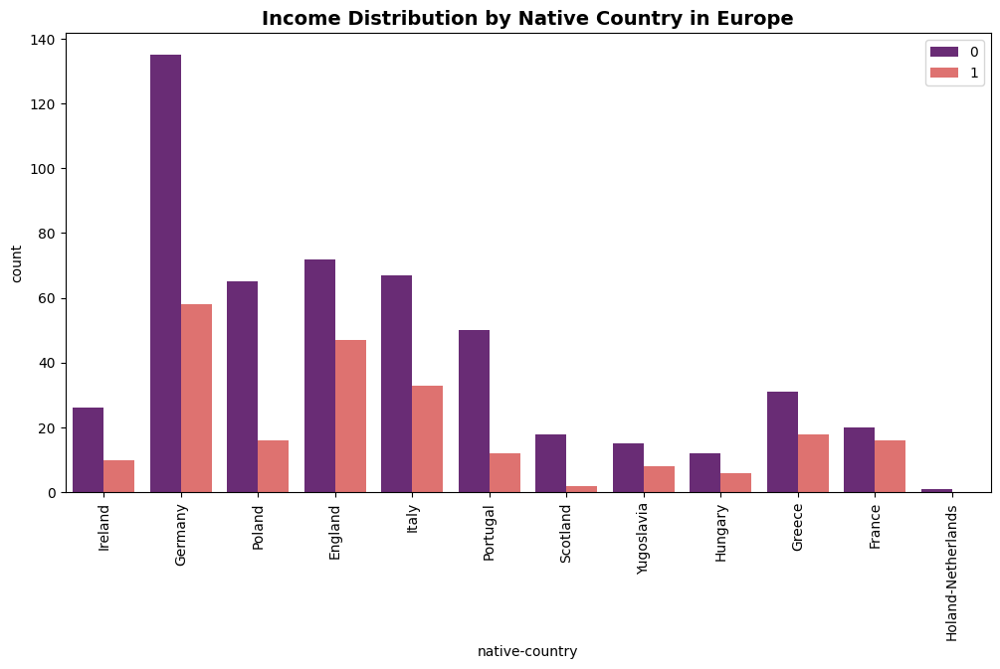

In [ ]:
df_europe = df[df['continent'] == 'Europe']

plt.figure(figsize=(12,6))
sns.countplot(x='native-country', hue='income', data=df_europe, palette='magma')
plt.title('Income Distribution by Native Country in Europe', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)
plt.show()

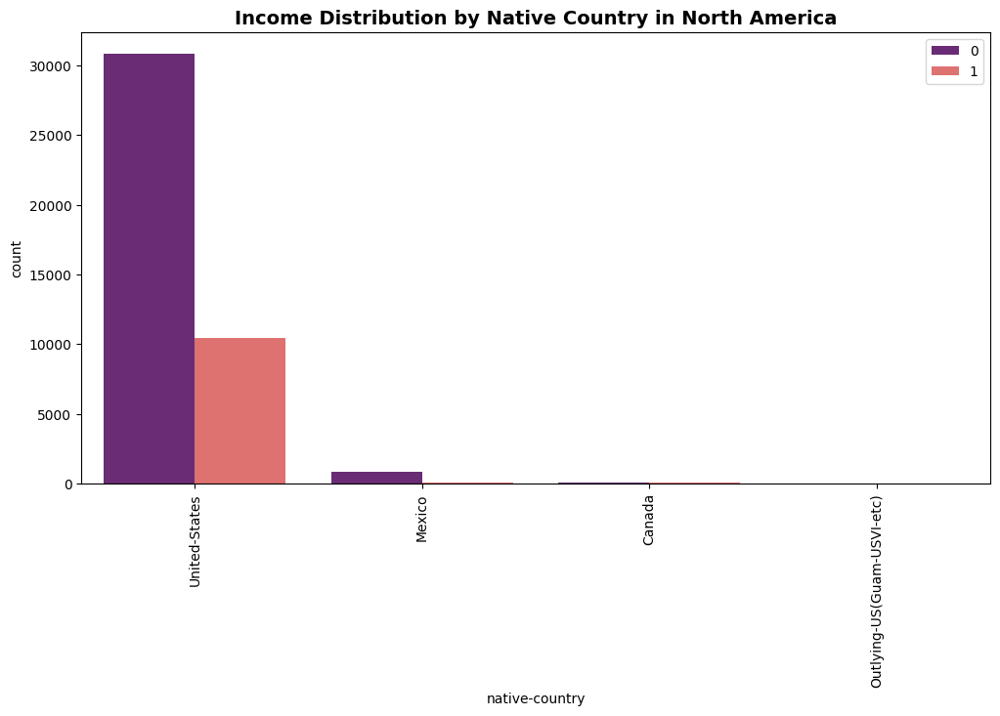

In [ ]:
df_north = df[df['continent'] == 'North America']

plt.figure(figsize=(12,6))
sns.countplot(x='native-country', hue='income', data=df_north, palette='magma')
plt.title('Income Distribution by Native Country in North America', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)
plt.show()

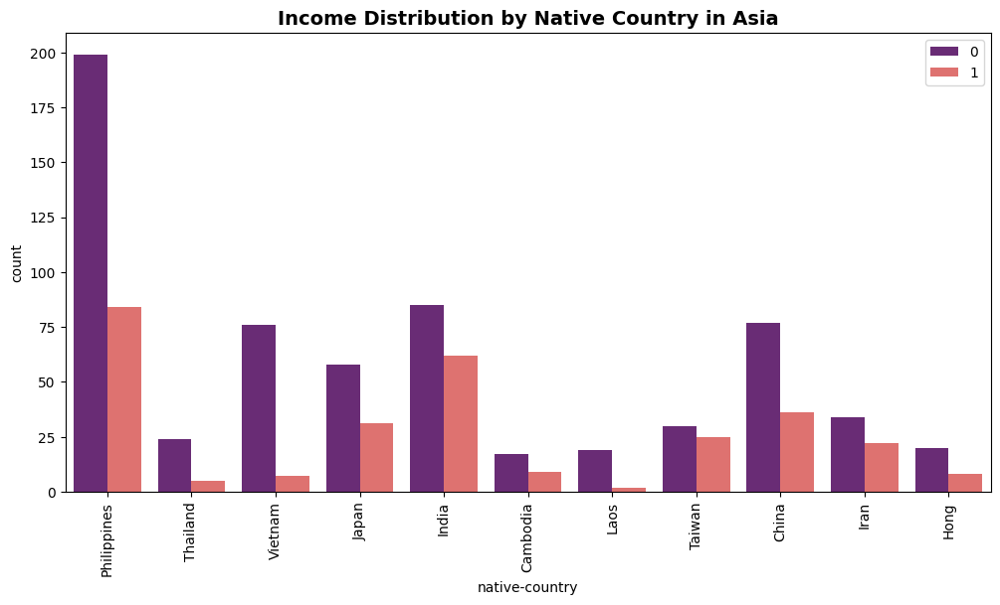

In [ ]:
df_asia = df[df['continent'] == 'Asia']

plt.figure(figsize=(12,6))
sns.countplot(x='native-country', hue='income', data=df_asia, palette='magma')
plt.title('Income Distribution by Native Country in Asia', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)
plt.show()

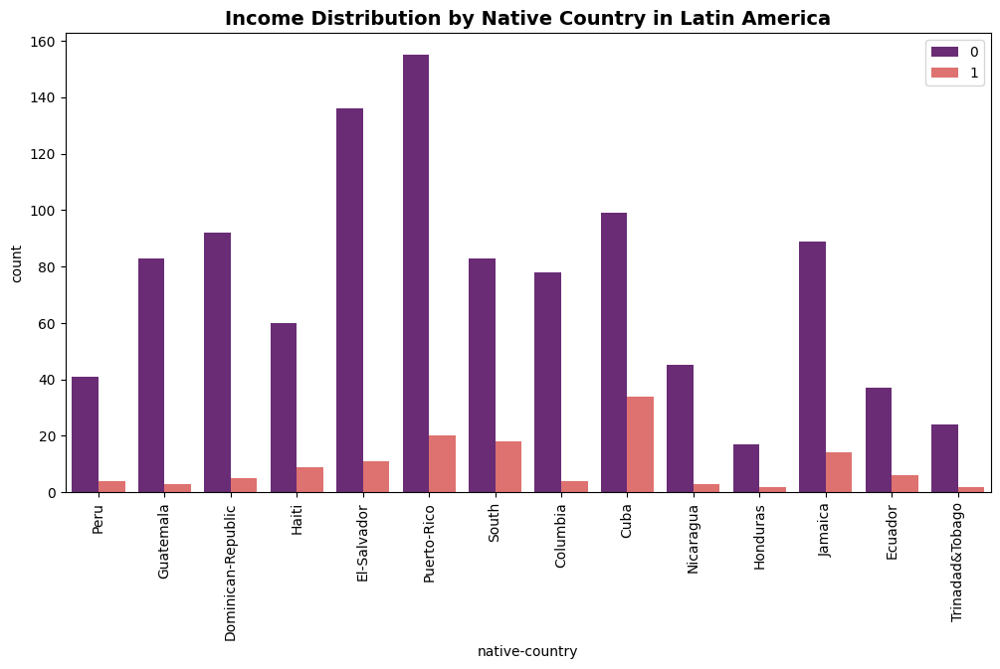

In [ ]:
df_latin = df[df['continent'] == 'Latin America']

plt.figure(figsize=(12,6))
sns.countplot(x='native-country', hue='income', data=df_latin, palette='magma')
plt.title('Income Distribution by Native Country in Latin America', fontsize=14, fontweight='bold')
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)
plt.show()

# Model selection

Imports needed for model training

In [ ]:
from sklearn.model_selection import train_test_split

#Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

#Metrics - classification report
from sklearn.metrics import classification_report

In [ ]:
#Creating a copy of the whole dataset in case we will need that later too check and compare
df_full = df.copy()

#Will be used later when performing counterfactual explanation (XAI method)
df_dice = df.copy()

In [ ]:
#Since we want to focus on fairness in our project, we remove sensitive columns that might create bias, in order to detect if new proxy will be found
sensitive_features = ['gender', 'race']
df_train = df.drop(columns=sensitive_features)

In [ ]:
print("Shape of data (without sensitive features):", df_train.shape)
print("Shape of data (with sensitive features):", df_full.shape)

Shape of data (without sensitive features): (45222, 12)
Shape of data (with sensitive features): (45222, 14)


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45222 entries, 0 to 48841
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             45222 non-null  int64 
 1   workclass       45222 non-null  object
 2   education       45222 non-null  object
 3   marital-status  45222 non-null  object
 4   occupation      45222 non-null  object
 5   relationship    45222 non-null  object
 6   capital-gain    45222 non-null  int64 
 7   capital-loss    45222 non-null  int64 
 8   hours-per-week  45222 non-null  int64 
 9   native-country  45222 non-null  object
 10  income          45222 non-null  int64 
 11  continent       45222 non-null  object
dtypes: int64(5), object(7)
memory usage: 4.5+ MB


In [ ]:
#Dropping the native-country column as we will use the continent column instead
columns = ['native-country']
df_train = df_train.drop(columns=columns)
df_dice = df_dice.drop(columns=columns)

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45222 entries, 0 to 48841
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             45222 non-null  int64 
 1   workclass       45222 non-null  object
 2   education       45222 non-null  object
 3   marital-status  45222 non-null  object
 4   occupation      45222 non-null  object
 5   relationship    45222 non-null  object
 6   capital-gain    45222 non-null  int64 
 7   capital-loss    45222 non-null  int64 
 8   hours-per-week  45222 non-null  int64 
 9   income          45222 non-null  int64 
 10  continent       45222 non-null  object
dtypes: int64(5), object(6)
memory usage: 4.1+ MB


In [ ]:
# Define the X as the columns without the target value
X = df_train.drop(columns=['income'])

# Y is the target value
y = df_train['income']

# One-hot encoding categorical columns
X = pd.get_dummies(X, drop_first=True)

# Splitting the data into train and test (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("Training set shape:", X_train.shape)
print("Test set shape:", X_test.shape)

Training set shape: (36177, 39)
Test set shape: (9045, 39)


In [ ]:
# Simple Logistic Regression - White box model and our baseline
model_lr = LogisticRegression()
model_lr.fit(X_train, y_train)
y_pred_lr = model_lr.predict(X_test)

print("\nLogistic Regression - Classification report:")
print(classification_report(y_test, y_pred_lr))


Logistic Regression - Classification report:
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      6842
           1       0.74      0.58      0.65      2203

    accuracy                           0.85      9045
   macro avg       0.81      0.76      0.78      9045
weighted avg       0.84      0.85      0.84      9045



/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Random Forest classifier - our first black-box model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

y_pred = model_rf.predict(X_test)
print("\nRandom Forest - Classification report:")
print(classification_report(y_test, y_pred))


Random Forest - Classification report:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      6842
           1       0.70      0.61      0.65      2203

    accuracy                           0.84      9045
   macro avg       0.79      0.76      0.78      9045
weighted avg       0.84      0.84      0.84      9045



In [ ]:
# XGBoost classifer - our second black-box model
model_xgb = XGBClassifier()
model_xgb.fit(X_train, y_train)
y_pred_xgb = model_xgb.predict(X_test)

print("\nXGBoost - Classification report:")
print(classification_report(y_test, y_pred_xgb))


XGBoost - Classification report:
              precision    recall  f1-score   support

           0       0.89      0.94      0.92      6842
           1       0.79      0.64      0.71      2203

    accuracy                           0.87      9045
   macro avg       0.84      0.79      0.81      9045
weighted avg       0.87      0.87      0.87      9045



# XAI methods




In [ ]:
# Installing the first XAI method we will use LIME
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=33efdf5cbcfb6fd5559cc7a664a41feb2797c87daded65ba378c97a66783afee
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


## LIME

In [ ]:
#Imports needed to use LIME for our machine learning models
import lime
import lime.lime_tabular

In [ ]:
#Creating an explainer that can futher be used for all the machine learning models to create explanations
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=['<=50K', '>50K'],
    discretize_continuous=True
)

### LIME for Logistic Regression

In [ ]:
# Testing the XAI method on the first instance:
instance_index = 0
instance_lr = X_test.iloc[instance_index].values
exp_lr = explainer.explain_instance(instance_lr, model_lr.predict_proba, num_features=10)

#Visualization of the explanation
exp_lr.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### LIME for Random Forest


In [ ]:
#Again, testing the first instance for LIME explanation for Random forest
instance_index = 0
exp_rf = explainer.explain_instance(X_test.iloc[instance_index].values, model_rf.predict_proba, num_features=10)

#Visualization
exp_rf.show_in_notebook(show_table=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


### LIME for XGBoost

In [ ]:
#First instance
instance_index = 0
instance_xgb = X_test.iloc[instance_index].values

exp_xgb = explainer.explain_instance(instance_xgb, model_xgb.predict_proba, num_features=10)

#Visualization
exp_xgb.show_in_notebook(show_table=True)

## Feature Importance

### Permutation Feature Importance


In [ ]:
from sklearn.inspection import permutation_importance

lr = permutation_importance(model_lr, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

#List of the most important feature when permutation is done (from most to least important)
importance_df_lr = pd.DataFrame({
    'feature': X.columns,
    'importance_mean': lr.importances_mean,
    'importance_std': lr.importances_std
}).sort_values(by='importance_mean', ascending=False)

print(importance_df_lr.head(10))

                       feature  importance_mean  importance_std
1                 capital-gain         0.032858        0.001525
15   marital-status_NotMarried         0.021581        0.002563
12          education_HighGrad         0.016506        0.001201
14           education_dropout         0.013179        0.001269
20  occupation_Exec-managerial         0.009397        0.001200
31  relationship_Not-in-family         0.008590        0.001928
16    marital-status_Separated         0.008391        0.002090
2                 capital-loss         0.005539        0.000931
26   occupation_Prof-specialty         0.005307        0.001435
33      relationship_Own-child         0.004677        0.001182


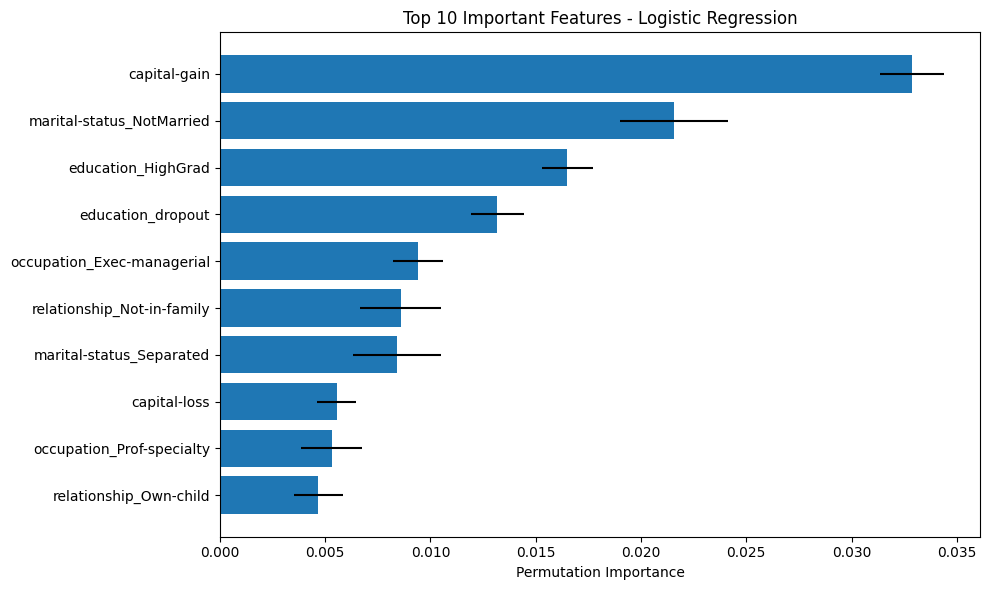

In [ ]:
#Top 10 features
top_features = importance_df_lr.head(10)

plt.figure(figsize=(10, 6))
plt.barh(top_features['feature'], top_features['importance_mean'], xerr=top_features['importance_std'])
plt.xlabel("Permutation Importance")
plt.title("Top 10 Important Features - Logistic Regression")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
rf = permutation_importance(model_rf, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

#List of the most important feature when permutation is done (from most to least important)
importance_df_rf = pd.DataFrame({
    'feature': X.columns,
    'importance_mean': rf.importances_mean,
    'importance_std': rf.importances_std
}).sort_values(by='importance_mean', ascending=False)

print(importance_df_rf.head(10))

/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


                       feature  importance_mean  importance_std
1                 capital-gain         0.041846        0.000924
15   marital-status_NotMarried         0.013941        0.001623
0                          age         0.012405        0.002906
2                 capital-loss         0.011808        0.000802
12          education_HighGrad         0.009198        0.001735
14           education_dropout         0.009011        0.001435
16    marital-status_Separated         0.005086        0.002104
20  occupation_Exec-managerial         0.004356        0.001374
31  relationship_Not-in-family         0.004146        0.001820
3               hours-per-week         0.003748        0.002442


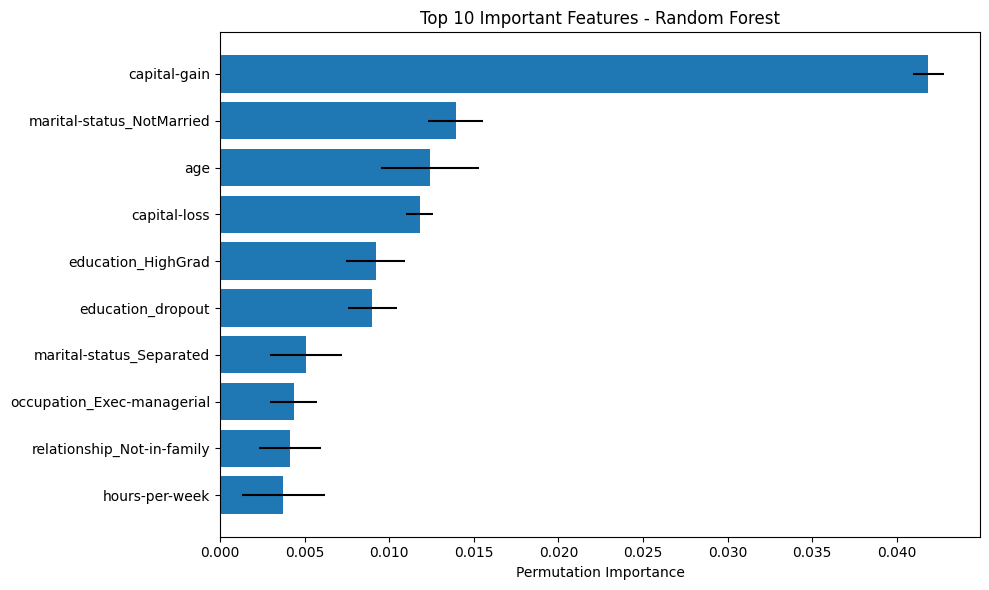

In [ ]:
top_features = importance_df_rf.head(10)

plt.figure(figsize=(10, 6))
plt.barh(top_features['feature'], top_features['importance_mean'], xerr=top_features['importance_std'])
plt.xlabel("Permutation Importance")
plt.title("Top 10 Important Features - Random Forest")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
xgb = permutation_importance(model_xgb, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

#List of the most important feature when permutation is done (from most to least important)
importance_df_xgb = pd.DataFrame({
    'feature': X.columns,
    'importance_mean': xgb.importances_mean,
    'importance_std': xgb.importances_std
}).sort_values(by='importance_mean', ascending=False)

print(importance_df_xgb.head(10))

                       feature  importance_mean  importance_std
1                 capital-gain         0.052305        0.001631
15   marital-status_NotMarried         0.021736        0.001824
0                          age         0.017225        0.001550
2                 capital-loss         0.015257        0.000771
14           education_dropout         0.015113        0.001287
16    marital-status_Separated         0.013742        0.001100
12          education_HighGrad         0.012991        0.001184
3               hours-per-week         0.008038        0.001310
10  education_CommunityCollege         0.007971        0.001089
20  occupation_Exec-managerial         0.005727        0.000685


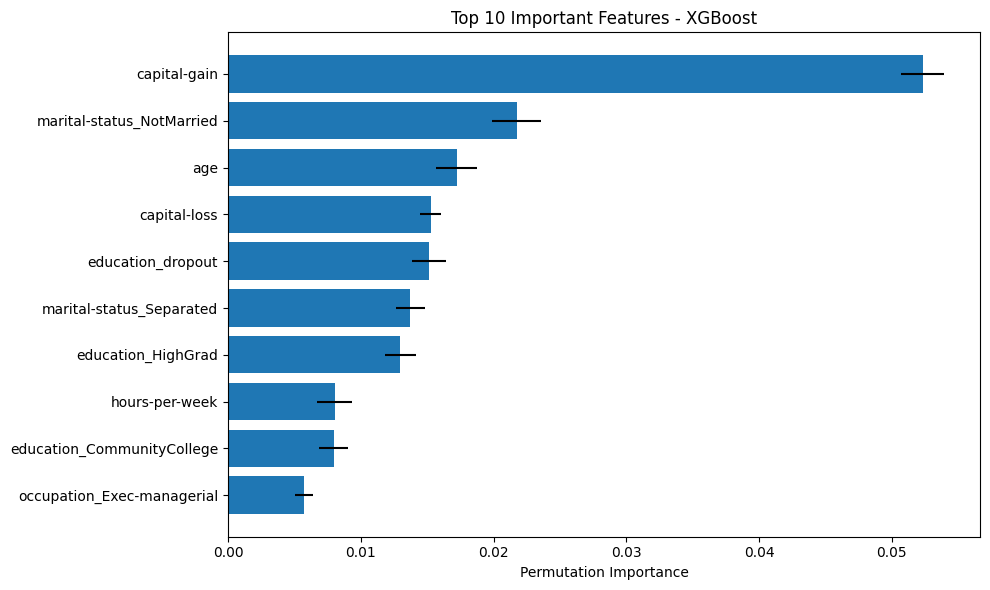

In [ ]:
top_features = importance_df_xgb.head(10)

plt.figure(figsize=(10, 6))
plt.barh(top_features['feature'], top_features['importance_mean'], xerr=top_features['importance_std'])
plt.xlabel("Permutation Importance")
plt.title("Top 10 Important Features - XGBoost")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### Feature Importance for Logistic Regression


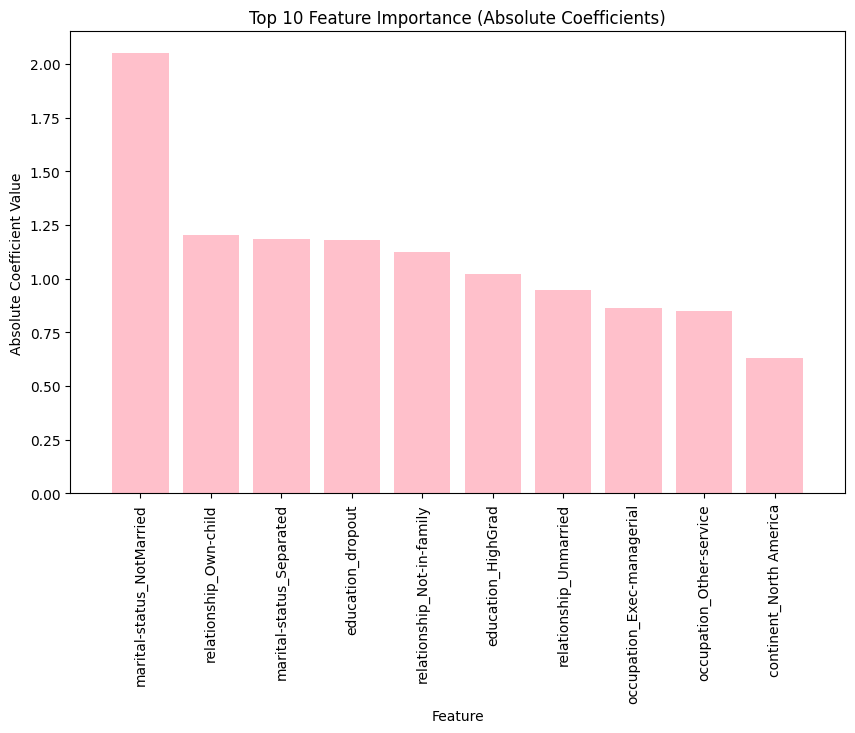

In [ ]:
# Calculating the coefficients since this is done for Logistic Regression (a linear model)
coefficients = model_lr.coef_[0]
indices = np.argsort(np.abs(coefficients))[::-1]

top_features = X_train.columns[indices][:10]
top_coefficients = coefficients[indices][:10]

#Visualizing the top 10 features
plt.figure(figsize=(10, 6))
plt.title("Top 10 Feature Importance (Absolute Coefficients)")
plt.bar(range(10), np.abs(top_coefficients), color="pink", align="center")
plt.xticks(range(10), top_features, rotation=90)
plt.xlim([-1, 10])
plt.xlabel("Feature")
plt.ylabel("Absolute Coefficient Value")
plt.show()


### Feature importance for Random Forest

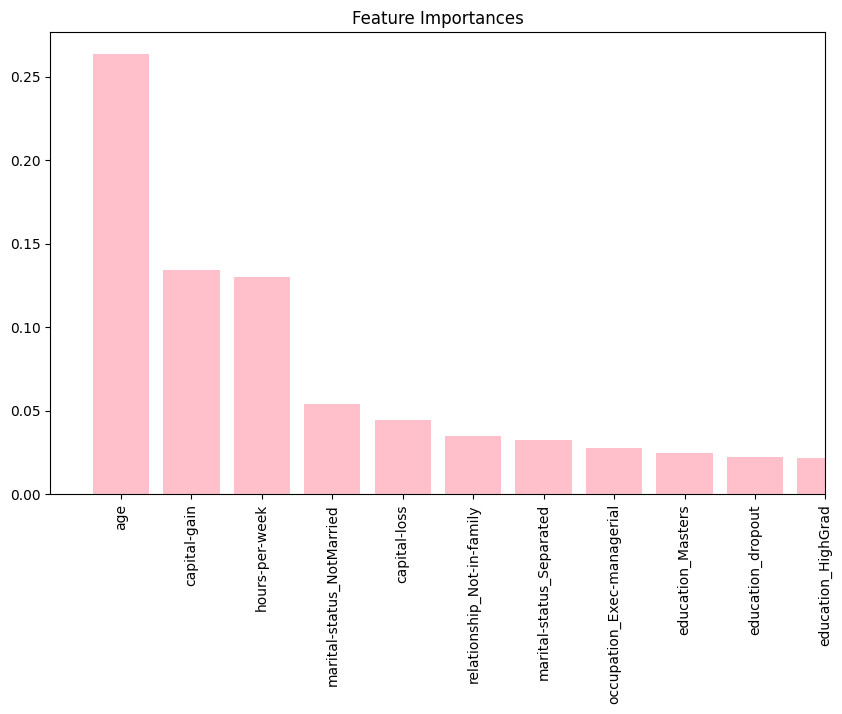

In [ ]:
importances = model_rf.feature_importances_
indices = np.argsort(importances)[::-1]

#Visualizing the top 10 features
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), importances[indices], color="pink", align="center")
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.xlim([-1, 10])
plt.show()


### Feature Importance for XGBoost

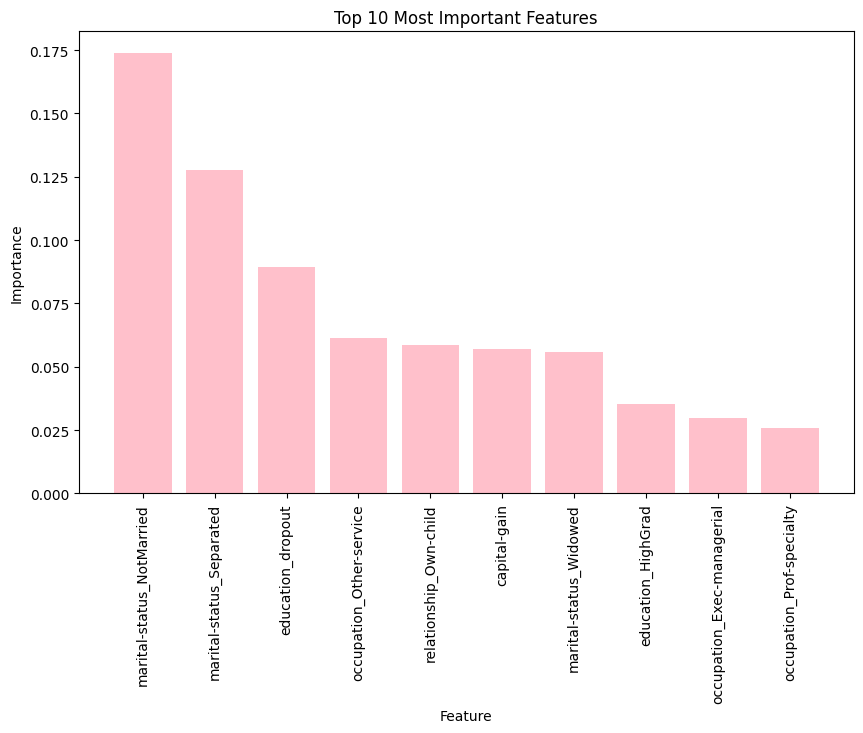

In [ ]:
importances = model_xgb.feature_importances_

indices = np.argsort(importances)[::-1]
top_features = X_train.columns[indices][:10]
top_importances = importances[indices][:10]


# Visualizing the top 10 features
plt.figure(figsize=(10, 6))
plt.bar(range(10), top_importances, color="pink", align="center")
plt.xticks(range(10), top_features, rotation=90)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Top 10 Most Important Features")
plt.show()

## SHAP

In [ ]:
#Installing SHAP
!pip install shap

### SHAP for Logistic Regression

### Global SHAP for Logistic Regression

/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


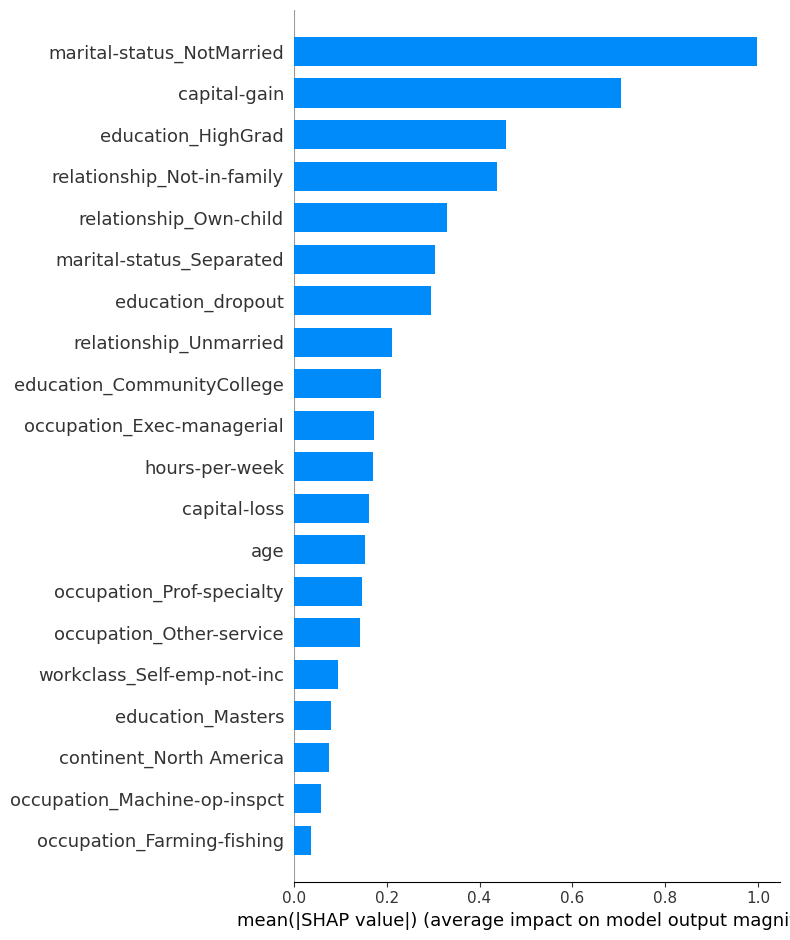

In [ ]:
import shap

# SHAP explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(model_lr, X_train, feature_perturbation="interventional")
shap_values_lr = explainer_lr.shap_values(X_test)

# Feature importance - Global explanation method (not for a specific instance)
shap.summary_plot(shap_values_lr, X_test, plot_type="bar")

The code below is using SHAP to explain why the first test instance in our dataset has an income under or over 50K. Below, we will also use SHAP to analyse two instances, one of class 1 and one of class 0.

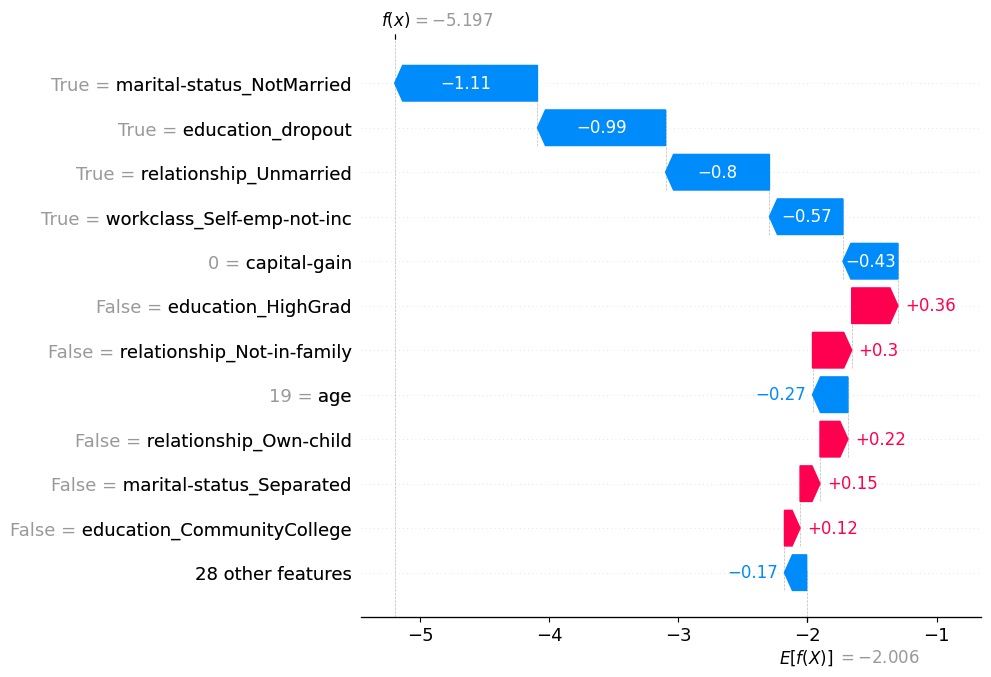

In [ ]:
shap.plots.waterfall(
    shap.Explanation(values=shap_values_lr[0],
                     base_values=explainer_lr.expected_value,
                     data=X_test.iloc[0],
                     feature_names=X_test.columns),
    max_display=12
)


In [ ]:
def explain_income_prediction(explainer, shap_values, X_test, y_test, class_label=1):
    #First instance for each of the classes
    instance_idx = y_test[y_test == class_label].index[0]

    instance_shap = shap_values[X_test.index.get_loc(instance_idx)]

    title = ">50K (Class 1)" if class_label == 1 else "<=50K (Class 0)"
    print(f"Explaining instance index {instance_idx}, classified as {title}")

    #The waterfall plot for that instance
    shap.plots.waterfall(
        shap.Explanation(values=instance_shap,
                         base_values=explainer.expected_value,
                         data=X_test.loc[instance_idx],
                         feature_names=X_test.columns),
        max_display=12
    )



Explaining instance index 42663, classified as >50K (Class 1)


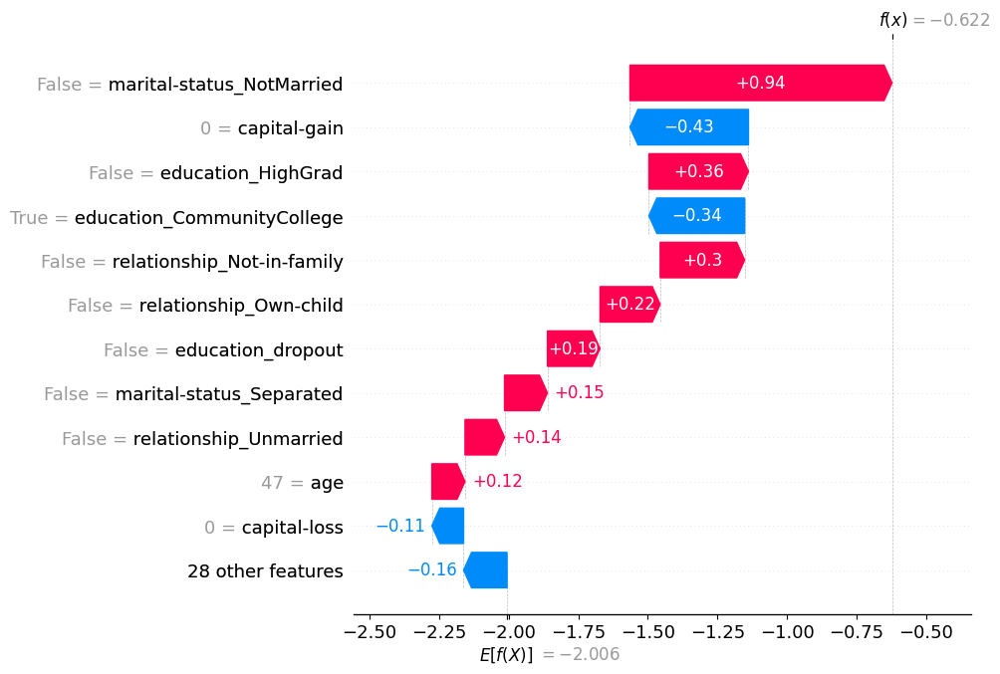

Explaining instance index 21762, classified as <=50K (Class 0)


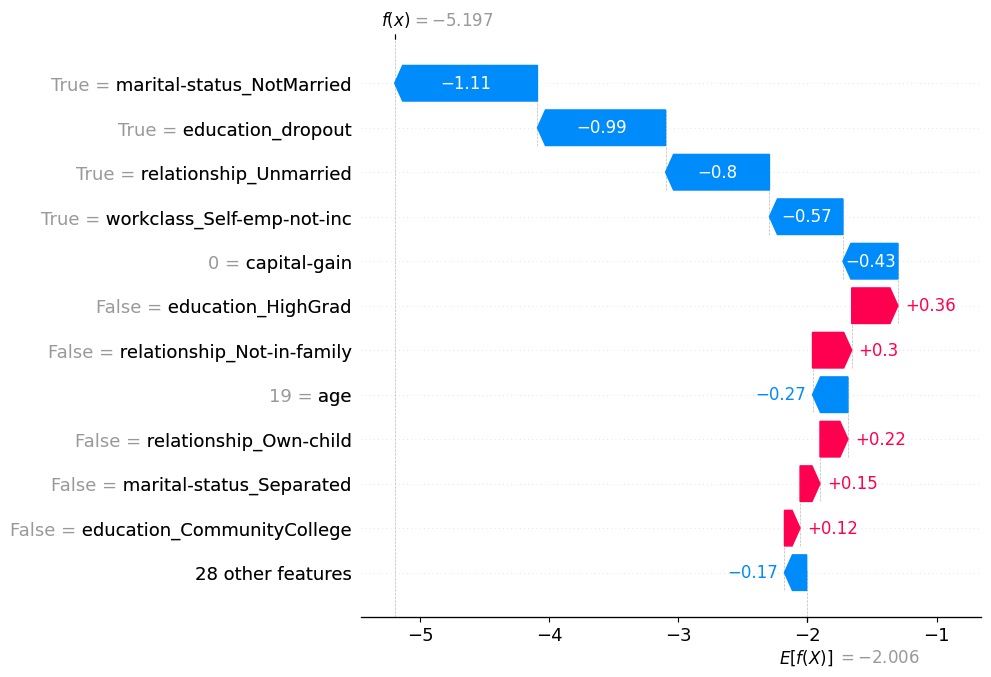

In [ ]:
# For an instance of class 1; earning more than 50k
explain_income_prediction(explainer_lr, shap_values_lr, X_test, y_test, class_label=1)

# For an instance of class 0; earning less than or equal to 50k
explain_income_prediction(explainer_lr, shap_values_lr, X_test, y_test, class_label=0)


# Test you individual - Prototype!
In this section you can decide which individual/sample from the dataset you first want to use in the machine learning models, and then the prototype will perform all the XAI methods on this given sample.

In [ ]:
sample_index = int(input("Enter the index of the individual you want to test: "))
sample = X_test.iloc[[sample_index]]

Enter the index of the individual you want to test: 44



Model: Random Forest
Prediction: 0


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


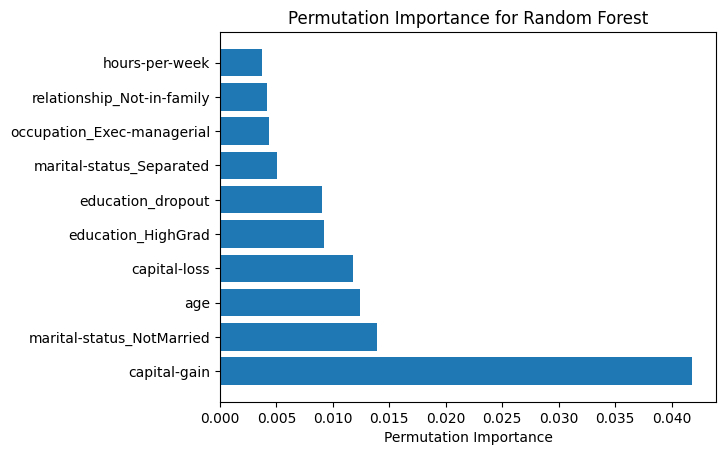

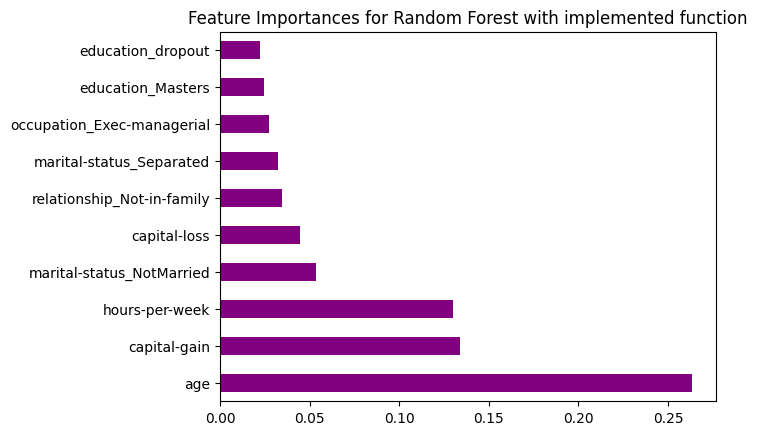


Model: Logistic Regression
Prediction: 0


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


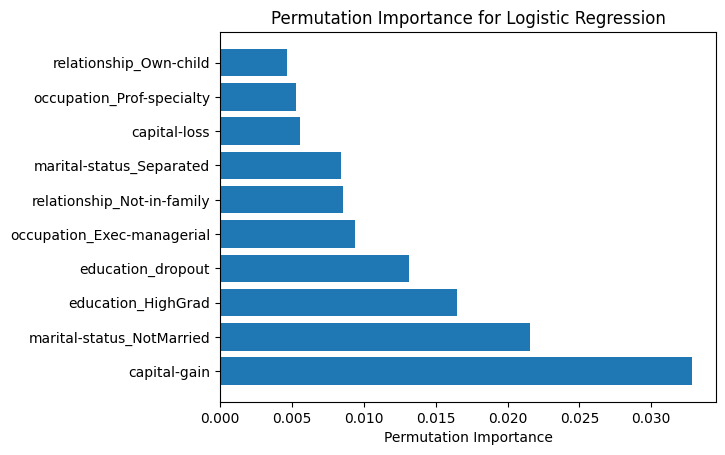

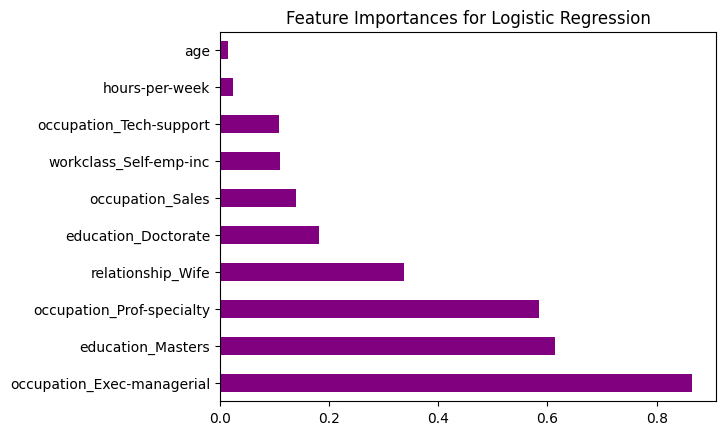


Model: XGBoost
Prediction: 0


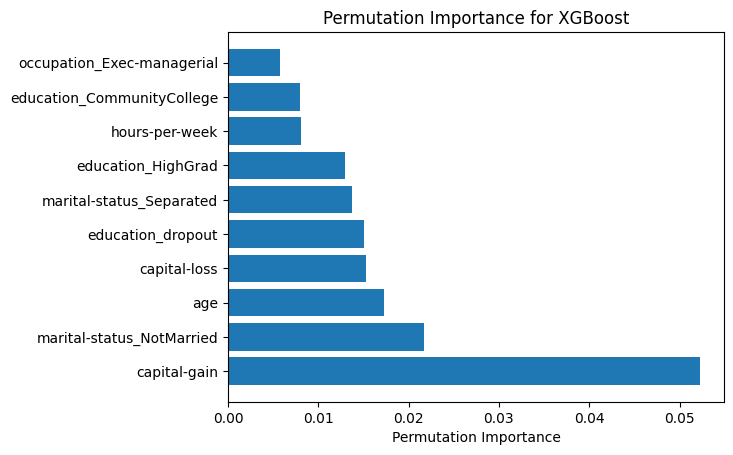

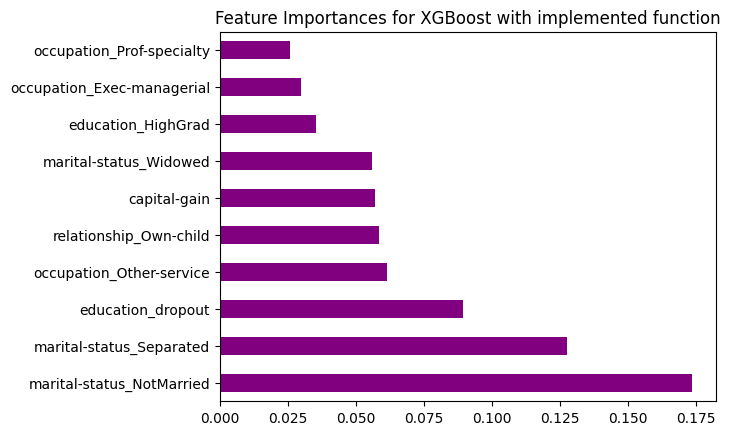

In [ ]:
models = {
    "Random Forest": model_rf,
    "Logistic Regression": model_lr,
    "XGBoost": model_xgb
}

for model_name, model in models.items():
    print(f"\nModel: {model_name}")

    pred = model.predict(sample)[0]
    print(f"Prediction: {pred}")

    #LIME
    from lime.lime_tabular import LimeTabularExplainer
    lime_explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=["<=50K", ">50K"], discretize_continuous=True)
    lime_exp = lime_explainer.explain_instance(sample.values[0], model.predict_proba)
    lime_exp.show_in_notebook(show_table=True)

    #Permutation feature importance
    result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)
    sorted_idx = result.importances_mean.argsort()[::-1]
    top10_idx = sorted_idx[:10]

    plt.barh(X_test.columns[top10_idx], result.importances_mean[top10_idx])
    plt.xlabel("Permutation Importance")
    plt.title(f"Permutation Importance for {model_name}")
    plt.show()

    #Feature Importance with built-in methods (coef_, and feature_importances_)
    if hasattr(model, "feature_importances_"):
        importances = model.feature_importances_
        feat_importances = pd.Series(importances, index=X_train.columns)
        feat_importances.nlargest(10).plot(kind='barh', color='purple', title=f'Feature Importances for {model_name} with implemented function')
        plt.show()
    elif hasattr(model, "coef_"):
        importances = model.coef_[0]
        feat_importances = pd.Series(importances, index=X_train.columns)
        feat_importances.nlargest(10).plot(kind='barh', color='purple', title=f'Feature Importances for {model_name}')
        plt.show()


# DiCE - Diverse Counterfactual Explanations

In [ ]:
!pip install pandas==2.0.3 numpy==1.24.4
!pip install dice-ml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 100.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 92.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.0.3 which is incompatible.
xarray 2025.3.1 requires pandas>=2.1, but you have pandas 2.0.3 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
plotnine 0.14.5 requires pandas>=2.2.0, but you have pandas 2.0.3 which is incompatible.
pymc 5.22.0 re

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 64.3 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
xarray 2025.3.1 requires pandas>=2.1, but you have pandas 1.5.3 which is incompatible.
dask-cudf-cu12 25.2.2 requires pandas<2.2.4dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
plotnine 0.14.5 requires pandas>=2.2.0, but you have pandas 1.5.3 which is incompatible.
dask-expr 1.1.21 requires pandas>=2, but you have pandas 1.5.3 which is incompatible.
pymc 5.22.0 requires numpy>=1.25.0, but you have numpy 1.24

In [ ]:
df_dice.shape

(45222, 13)

In [ ]:
df_dice.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45222 entries, 0 to 48841
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             45222 non-null  int64 
 1   workclass       45222 non-null  object
 2   education       45222 non-null  object
 3   marital-status  45222 non-null  object
 4   occupation      45222 non-null  object
 5   relationship    45222 non-null  object
 6   race            45222 non-null  object
 7   gender          45222 non-null  object
 8   capital-gain    45222 non-null  int64 
 9   capital-loss    45222 non-null  int64 
 10  hours-per-week  45222 non-null  int64 
 11  income          45222 non-null  int64 
 12  continent       45222 non-null  object
dtypes: int64(5), object(8)
memory usage: 4.8+ MB


In [ ]:
import dice_ml
from dice_ml import Dice

#Defining the columns; where we also excluded the 'race' and 'gender' columns, as we did in the previous/original preprocessin
continuous = ['age', 'capital-gain', 'capital-loss', 'hours-per-week']
categorical = ['workclass', 'education', 'marital-status', 'occupation',
               'relationship', 'continent']
target = 'income'

### Logistic Regression

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

#Removing the sensitive columns
drop_cols = ['income', 'race', 'gender']
X = df_dice.drop(columns=drop_cols)

#Target value
y = df_dice['income']

encoder = OrdinalEncoder()
# Encoding the categorical columns with Ordinal encoder instead of One-Hot encoding, which is necessary for DiCE to work
X_encoded = X.copy()
X_encoded[categorical] = encoder.fit_transform(X[categorical])

# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)


In [ ]:
#Logistic Regression - DiCE
dice_lr= LogisticRegression(max_iter=1000)
dice_lr.fit(X_train, y_train)


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=1000)

In [ ]:
from dice_ml.model_interfaces.base_model import BaseModel

class WrappedModel(BaseModel):
    def __init__(self, model, encoder, feature_names):
        super().__init__()
        self.model = model
        self.encoder = encoder
        self.feature_names = feature_names

    def predict(self, input_df):
        input_copy = input_df.copy()
        input_copy[self.encoder.feature_names_in_] = self.encoder.transform(input_copy[self.encoder.feature_names_in_])
        return self.model.predict(input_copy)

    def predict_proba(self, input_df):
        input_copy = input_df.copy()
        input_copy[self.encoder.feature_names_in_] = self.encoder.transform(input_copy[self.encoder.feature_names_in_])
        return self.model.predict_proba(input_copy)


In [ ]:
data_dice = dice_ml.Data(
    dataframe=df_dice.drop(columns=['race', 'gender']),
    continuous_features=continuous,
    categorical_features=categorical,
    outcome_name=target
)

In [ ]:
wrapped_model = WrappedModel(dice_lr, encoder, X_train.columns)

model_dice_lr = dice_ml.Model(model=wrapped_model, backend="sklearn")
exp_log = Dice(data_dice, model_dice_lr, method="random")

In [ ]:
query_instance = df_dice.drop(columns=[target, 'race', 'gender']).iloc[[0]]
cf = exp_log.generate_counterfactuals(query_instance, total_CFs=3, desired_class="opposite")
cf.visualize_as_dataframe()


100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

Query instance (original outcome : 0)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,0,0,40,North America,0



Diverse Counterfactual set (new outcome: 1)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,68,Private,dropout,NotMarried,Machine-op-inspct,Own-child,54572,0,40,North America,1
1,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,92207,0,44,North America,1
2,75,Private,dropout,NotMarried,Machine-op-inspct,Own-child,25894,0,40,North America,1


### Random Forest

In [ ]:
dice_rf = RandomForestClassifier(random_state=42)
dice_rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
class WrappedRandomForest(BaseModel):
    def __init__(self, model, encoder, categorical_features):
        super().__init__()
        self.model = model
        self.encoder = encoder
        self.categorical_features = categorical_features

    def _encode(self, df):
        df_encoded = df.copy()
        df_encoded[self.categorical_features] = self.encoder.transform(df[self.categorical_features])
        return df_encoded

    def predict(self, input_df):
        input_encoded = self._encode(input_df)
        return self.model.predict(input_encoded)

    def predict_proba(self, input_df):
        input_encoded = self._encode(input_df)
        return self.model.predict_proba(input_encoded)


In [ ]:
wrapped_rf = WrappedRandomForest(dice_rf, encoder, categorical)
model_dice_rf = dice_ml.Model(model=wrapped_rf, backend="sklearn")

exp_rf = Dice(data_dice, model_dice_rf, method="random")


In [ ]:
cf = exp_rf.generate_counterfactuals(
    query_instance,
    total_CFs=3,
    desired_class="opposite",
    features_to_vary=[f for f in X.columns if f != 'gender']
)

cf.visualize_as_dataframe()


100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

Query instance (original outcome : 0)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,0,0,40,North America,0



Diverse Counterfactual set (new outcome: 1)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,29767,0,56,North America,1
1,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,45567,0,40,Asia,1
2,25,Private,dropout,Widowed,Machine-op-inspct,Own-child,93399,0,40,North America,1


## XGBoost


In [ ]:
dice_xgb = XGBClassifier()
dice_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
class XGBWrappedModel(BaseModel):
    def __init__(self, model, encoder=None, categorical_features=None):
        super().__init__()
        self.model = model
        self.encoder = encoder
        self.categorical_features = categorical_features

    def _encode(self, df):
        df_copy = df.copy()
        if self.encoder:
            features = self.categorical_features or self.encoder.feature_names_in_
            df_copy[features] = self.encoder.transform(df_copy[features])
        return df_copy.astype(float)

    def predict(self, input_df):
        input_encoded = self._encode(input_df)
        return self.model.predict(input_encoded)

    def predict_proba(self, input_df):
        input_encoded = self._encode(input_df)
        return self.model.predict_proba(input_encoded)


In [ ]:
wrapped_xgb = XGBWrappedModel(dice_xgb, encoder, categorical)
model_dice_xgb = dice_ml.Model(model=wrapped_xgb, backend="sklearn")

exp_xgb = Dice(data_dice, model_dice_xgb, method="random")


In [ ]:
cf = exp_xgb.generate_counterfactuals(
    query_instance,
    total_CFs=3,
    desired_class="opposite",
    features_to_vary=[f for f in X.columns if f != 'gender']
)

cf.visualize_as_dataframe()


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

Query instance (original outcome : 0)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,0,0,40,North America,0



Diverse Counterfactual set (new outcome: 1)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,48333,0,40,North America,1
1,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,7327,0,40,North America,1
2,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,32212,0,40,North America,1


## Test your individual - Prototype DiCE!

In [ ]:
sample_index = int(input("Enter sample index: "))
query_instance = df_dice.drop(columns=[target, 'race', 'gender']).iloc[[sample_index]]

print('Counterfactual explanation with 3 examples for Logitistc Regression')

#Generate counterfactruals for Logistic Regression
cf_lr = exp_log.generate_counterfactuals(
    query_instance,
    total_CFs=3,
    desired_class="opposite"
)
cf_lr.visualize_as_dataframe()

print('\n\n\nCounterfactual explanation with 3 examples for Random Forest')
# Generate counterfactuals for Random Forest
cf_rf = exp_rf.generate_counterfactuals(
    query_instance,
    total_CFs=3,
    desired_class="opposite"
)
cf_rf.visualize_as_dataframe()

print('\n\n\nCounterfactual explanation with 3 examples for XGBoost')
# Generate counterfactuals for Random Forest
cf_xgb = exp_xgb.generate_counterfactuals(
    query_instance,
    total_CFs=3,
    desired_class="opposite"
)
cf_xgb.visualize_as_dataframe()

Enter sample index: 560
Counterfactual explanation with 3 examples for Logitistc Regression


100%|██████████| 1/1 [00:00<00:00,  8.85it/s]

Query instance (original outcome : 0)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,0,0,40,North America,0



Diverse Counterfactual set (new outcome: 1)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,68467,0,40,Europe,1
1,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,32410,0,40,North America,1
2,21,Private,CommunityCollege,NotMarried,Craft-repair,Other-relative,0,3778,40,North America,1





Counterfactual explanation with 3 examples for Random Forest


100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

Query instance (original outcome : 0)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,0,0,40,North America,0



Diverse Counterfactual set (new outcome: 1)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,0,3296,40,North America,1
1,21,Private,CommunityCollege,NotMarried,Farming-fishing,Other-relative,40099,0,40,North America,1
2,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,9413,114,40,North America,1





Counterfactual explanation with 3 examples for XGBoost


100%|██████████| 1/1 [00:00<00:00,  6.67it/s]

Query instance (original outcome : 0)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,0,0,40,North America,0



Diverse Counterfactual set (new outcome: 1)


,age,workclass,education,marital-status,occupation,relationship,capital-gain,capital-loss,hours-per-week,continent,income
0,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,14389,0,40,Asia,1
1,21,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,98777,2411,40,North America,1
2,80,Private,CommunityCollege,NotMarried,Exec-managerial,Other-relative,42959,0,40,North America,1
